In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon
import folium
from folium.plugins import HeatMap
import pandas as pd
import numpy as np 
import seaborn as sns
from shapely.geometry import Point


# Load the dataset for Canadian provinces (replace with the path to your downloaded shapefile)
shapefile_path = 'C:/Users/xuebi/Downloads/lcd_000b16a_e/lcd_000b16a_e.shp'
canada_provinces = gpd.read_file(shapefile_path)

C:\Users\xuebi\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
# shapefile_path = 'C:/Users/xuebi/Downloads/lcd_000b16a_e/lcd_000b16a_e.shx'
# canada_provincesD = gpd.read_file(shapefile_path)
# print(canada_provincesD)
# # Filter for Quebec (using the ISO code or province name)

quebec = canada_provinces[canada_provinces['CDUID'] == '2401']
# print(quebec["CDNAME"])
quebec_full = canada_provinces[canada_provinces['PRNAME'] == 'Quebec / Québec']
# print(quebec[quebec['CDUID'] == '2499'])
# multi_poly = quebec.loc[4,"geometry"]

# if isinstance(multi_poly, MultiPolygon):
#     # Iterate over the individual Polygons in the MultiPolygon
#     i = 0
#     for poly in multi_poly.geoms:
#         print(i)  # Each `poly` is a Polygon object
#         i +=1
# for geom in multi_poly.geoms:
#     plt.plot(*geom.exterior.xy)
#     break        

# # Plot the map of Quebec
# fig, ax = plt.subplots(figsize=(10, 10))
# quebec.plot(ax=ax, color='lightblue', edgecolor='black')
# # Add title and remove axes
# ax.set_title('Map of Quebec', fontsize=15)
# ax.set_axis_off()
# plt.show()

df = pd.read_csv('./data_extraction/canada_residency_data.csv')
df = df.drop("COORDONNÉES", axis = 1)
data_menage_region = df[("Taille moyenne des ménages"!=df["Taille du ménage (8)"]) & ("Total - Type de construction résidentielle"!=df["Type de construction résidentielle (9)"])]
geom_data = data_menage_region["DGUID"]


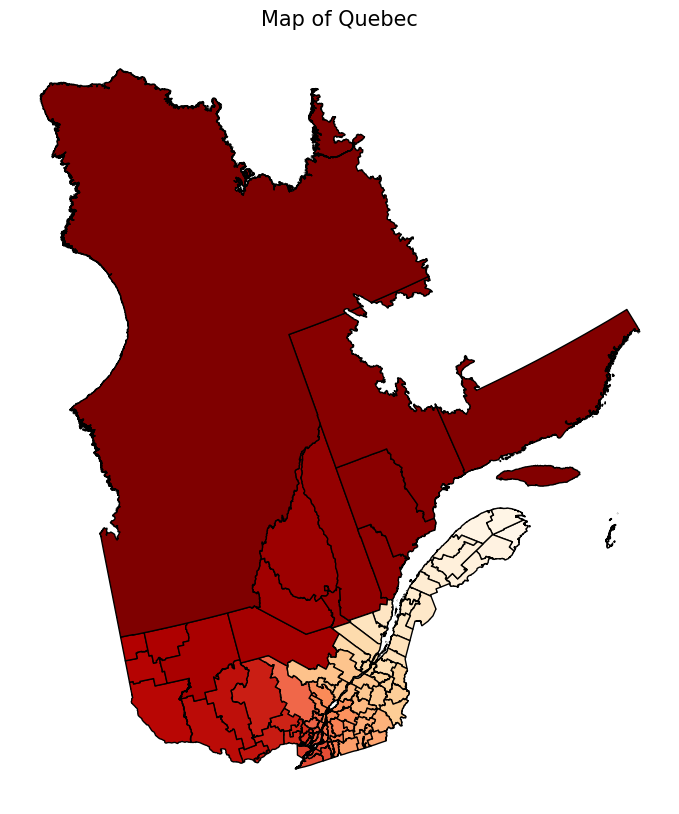

In [3]:
fig, ax = plt.subplots(figsize=(10, 10))
quebec_full.plot(column = "CDUID", ax=ax, cmap='OrRd', edgecolor='black')
# Add title and remove axes
ax.set_title('Map of Quebec', fontsize=15)
ax.set_axis_off()
plt.show()

<Axes: xlabel='Type de construction résidentielle (9)'>

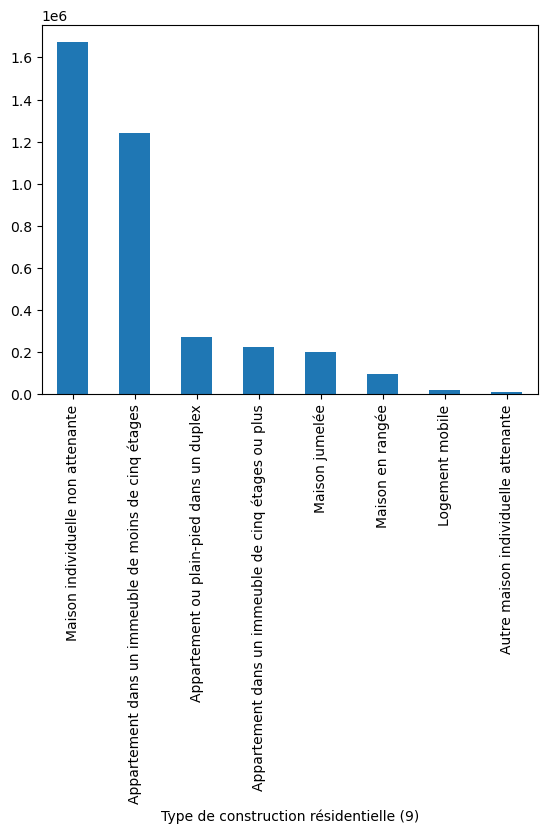

In [4]:
variations_per_cat = data_menage_region[data_menage_region["VALEUR"] > 100].groupby("Type de construction résidentielle (9)").sum()["VALEUR"].sort_values(ascending=False)
variations_per_cat.plot(kind = "bar", x = "Type de construction résidentielle (9)")

In [5]:
variations_per_cat = data_menage_region[data_menage_region["VALEUR"] > 1000]
variations_per_cat = variations_per_cat[(variations_per_cat["Type de construction résidentielle (9)"] == "Logement mobile") | (variations_per_cat["Type de construction résidentielle (9)"] == "Autre maison individuelle attenante")].shape[0]


In [6]:
variations_per_cat

5

In [7]:
fitering  = 10**np.linspace(0,5,30)
total_households = []
total_categories = []
n_unique = []
var_low_cat = []
for i in fitering:
    data = data_menage_region[data_menage_region["VALEUR"] > i]
    variations_per_cat = data[(data["Type de construction résidentielle (9)"] == "Logement mobile") | (data["Type de construction résidentielle (9)"] == "Autre maison individuelle attenante")].shape[0]

    total_households.append(data["VALEUR"].sum())
    total_categories.append(data["VALEUR"].shape[0])
    n_unique.append(data["GÉO"].nunique())
    var_low_cat.append(variations_per_cat)

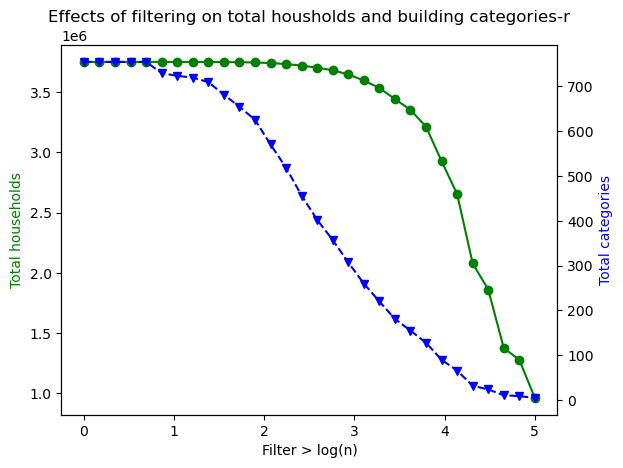

In [8]:
fig, ax1 = plt.subplots()
ax1.plot(np.log10(fitering), total_households, 'g-',marker = "o", label='Total households')
ax1.set_xlabel('Filter > log(n)')
ax1.set_ylabel('Total households', color='g')

ax2 = ax1.twinx()
ax2.plot(np.log10(fitering), total_categories, 'b--',marker = "v", label='Total categories')
ax2.set_ylabel('Total categories', color='b')
plt.title('Effects of filtering on total housholds and building categories-r')
plt.show()

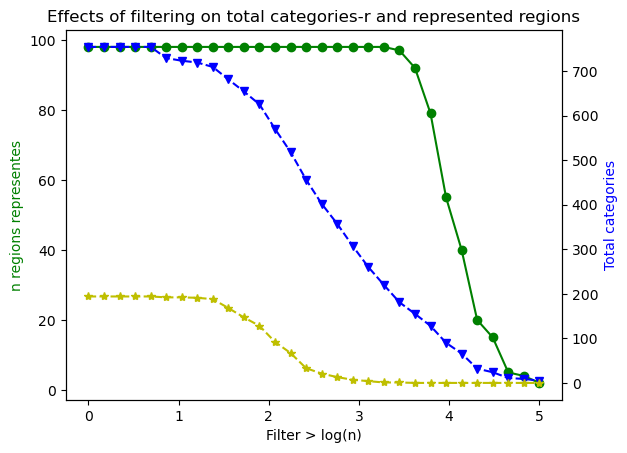

In [9]:
fig, ax1 = plt.subplots()
ax1.plot(np.log10(fitering), n_unique, 'g-',marker = "o", label='n unique')
ax1.set_xlabel('Filter > log(n)')
ax1.set_ylabel('n regions representes', color='g')

ax2 = ax1.twinx()
ax2.plot(np.log10(fitering), total_categories, 'b--',marker = "v", label='Total categories')
ax2.plot(np.log10(fitering), var_low_cat, 'y--',marker = "*", label='Total categories')
ax2.set_ylabel('Total categories', color='b')
plt.title('Effects of filtering on total categories-r and represented regions')
plt.show()

In [10]:
data_menage_region[data_menage_region["DGUID"] == "2021A00032466"]

,PÉRIODE DE RÉFÉRENCE,GÉO,DGUID,Type de construction résidentielle (9),Taille du ménage (8),VALEUR
1133,2021.0,Montréal,2021A00032466,Maison individuelle non attenante,Total - Taille du ménage,100620.0
1135,2021.0,Montréal,2021A00032466,Maison jumelée,Total - Taille du ménage,32530.0
1137,2021.0,Montréal,2021A00032466,Maison en rangée,Total - Taille du ménage,34075.0
1139,2021.0,Montréal,2021A00032466,Appartement ou plain-pied dans un duplex,Total - Taille du ménage,110435.0
1141,2021.0,Montréal,2021A00032466,Appartement dans un immeuble de moins de cinq ...,Total - Taille du ménage,479885.0
1143,2021.0,Montréal,2021A00032466,Appartement dans un immeuble de cinq étages ou...,Total - Taille du ménage,148935.0
1145,2021.0,Montréal,2021A00032466,Autre maison individuelle attenante,Total - Taille du ménage,3450.0
1147,2021.0,Montréal,2021A00032466,Logement mobile,Total - Taille du ménage,430.0


In [11]:
data = data_menage_region[data_menage_region["VALEUR"] > 0]
original = data["VALEUR"].sum()
variations_per_cat = data[(data["Type de construction résidentielle (9)"] != "Logement mobile") & (data["Type de construction résidentielle (9)"] != "Autre maison individuelle attenante")]["VALEUR"].sum()
print(f"Original total buildings : {original} | without mobile and other : {variations_per_cat} | total_delta : {original-variations_per_cat}" )

Original total buildings : 3749025.0 | without mobile and other : 3709550.0 | total_delta : 39475.0


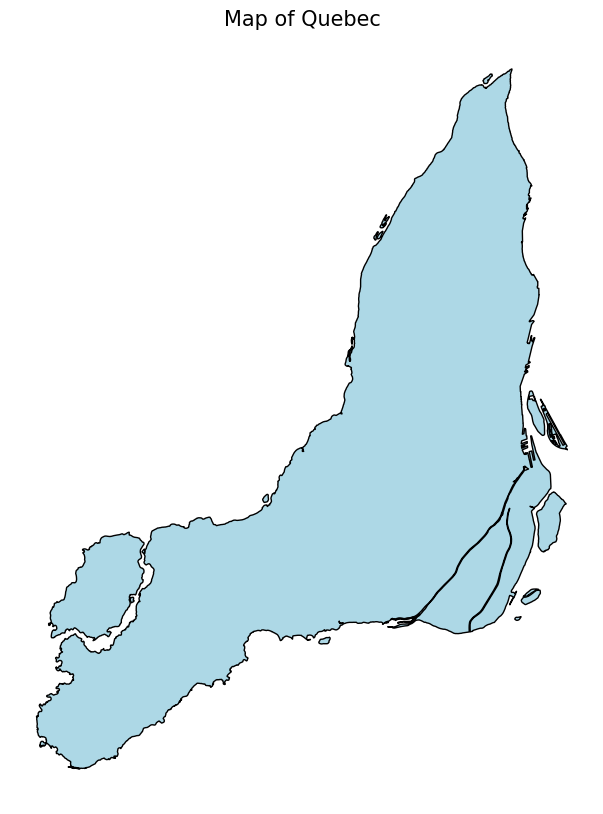

In [12]:
montreal = quebec_full[quebec_full["CDNAME"] == "Montréal"]

fig, ax = plt.subplots(figsize=(10, 10))
montreal.plot(ax=ax, color='lightblue', edgecolor='black')
# Add title and remove axes
ax.set_title('Map of Quebec', fontsize=15)
ax.set_axis_off()
plt.show()

In [13]:
quebec_full['Maison individuelle non attenante'] = 0
quebec_full['Maison jumelée'] = 0
quebec_full['Maison en rangée'] = 0
quebec_full['Appartement ou plain-pied dans un duplex'] = 0
quebec_full['Appartement dans un immeuble de moins de cinq étages'] = 0
quebec_full['Appartement dans un immeuble de cinq étages ou plus'] = 0

C:\Users\xuebi\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\xuebi\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\xuebi\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

In [14]:
data_menage_region = data_menage_region[data_menage_region["VALEUR"] > 0]

In [15]:
data_menage_region

,PÉRIODE DE RÉFÉRENCE,GÉO,DGUID,Type de construction résidentielle (9),Taille du ménage (8),VALEUR
2,2021.0,Communauté maritime des Îles-de-la-Madeleine,2021A00032401,Maison individuelle non attenante,Total - Taille du ménage,4945.0
4,2021.0,Communauté maritime des Îles-de-la-Madeleine,2021A00032401,Maison jumelée,Total - Taille du ménage,200.0
6,2021.0,Communauté maritime des Îles-de-la-Madeleine,2021A00032401,Maison en rangée,Total - Taille du ménage,105.0
8,2021.0,Communauté maritime des Îles-de-la-Madeleine,2021A00032401,Appartement ou plain-pied dans un duplex,Total - Taille du ménage,160.0
10,2021.0,Communauté maritime des Îles-de-la-Madeleine,2021A00032401,Appartement dans un immeuble de moins de cinq ...,Total - Taille du ménage,355.0
...,...,...,...,...,...,...
1723,2021.0,Nord-du-Québec,2021A00032499,Maison en rangée,Total - Taille du ménage,460.0
1725,2021.0,Nord-du-Québec,2021A00032499,Appartement ou plain-pied dans un duplex,Total - Taille du ménage,445.0
1727,2021.0,Nord-du-Québec,2021A00032499,Appartement dans un immeuble de moins de cinq ...,Total - Taille du ménage,1780.0
1730,2021.0,Nord-du-Québec,2021A00032499,Autre maison individuelle attenante,Total - Taille du ménage,25.0


In [16]:
list_of_importance = ['Maison individuelle non attenante','Maison jumelée', 'Maison en rangée', 'Appartement ou plain-pied dans un duplex', 'Appartement dans un immeuble de moins de cinq étages','Appartement dans un immeuble de cinq étages ou plus']
for index, row in quebec_full.iterrows():
    geoid = row["CDUID"]
    local_d = data_menage_region[data_menage_region["DGUID"] ==f"2021A0003{geoid}"]
    for elements in list_of_importance:
        try:
            quebec_full.at[index, elements] = local_d[local_d["Type de construction résidentielle (9)"] == elements]["VALEUR"]._values[0]

        except:
            quebec_full.at[index, elements] = 0
#     quebec_full.at[index, 'Maison individuelle non attenante'] = local_d[local_d["Type de construction résidentielle (9)"] == "Maison individuelle non attenante"]["VALEUR"]
#     quebec_full.at[index,'Maison jumelée'] = local_d[local_d["Type de construction résidentielle (9)"] == "Maison jumelée"]["VALEUR"]
#     quebec_full.at[index,'Maison en rangée'] = local_d[local_d["Type de construction résidentielle (9)"] == "Maison en rangée"]["VALEUR"]
#     quebec_full.at[index,'Appartement ou plain-pied dans un duplex'] = local_d[local_d["Type de construction résidentielle (9)"] == "Appartement ou plain-pied dans un duplex"]["VALEUR"]
#     quebec_full.at[index,'Appartement dans un immeuble de moins de cinq étages'] = local_d[local_d["Type de construction résidentielle (9)"] == "Appartement dans un immeuble de moins de cinq étages"]["VALEUR"]
#     quebec_full.at[index,'Appartement dans un immeuble de cinq étages ou plus'] = local_d[local_d["Type de construction résidentielle (9)"] == "Appartement dans un immeuble de cinq étages ou plus"]["VALEUR"]

In [17]:
# quebec_full.at[index, elements] = local_d[local_d["Type de construction résidentielle (9)"] == elements]["VALEUR"]

In [18]:
quebec_full.at[index, elements] = local_d[local_d["Type de construction résidentielle (9)"] == elements]["VALEUR"]._values[0]

In [19]:
list_of_importance = ['Maison individuelle non attenante','Maison jumelée', 'Maison en rangée', 'Appartement ou plain-pied dans un duplex', 'Appartement dans un immeuble de moins de cinq étages','Appartement dans un immeuble de cinq étages ou plus']

ValueError: Categorical categories must be unique

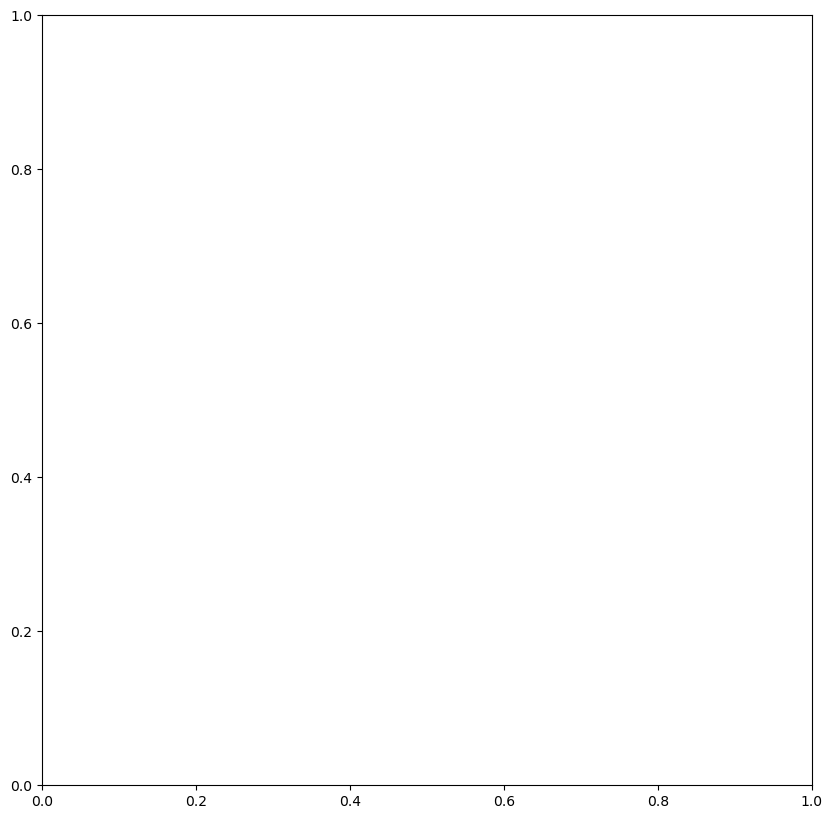

In [20]:
fig, ax = plt.subplots(figsize=(10, 10))
quebec_full.plot(column = "Appartement dans un immeuble de cinq étages ou plus", ax=ax, cmap='OrRd', edgecolor='black',scheme='percentiles',legend=True)
# Add title and remove axes
ax.set_title('Map of Quebec', fontsize=15)
ax.set_axis_off()
plt.show()

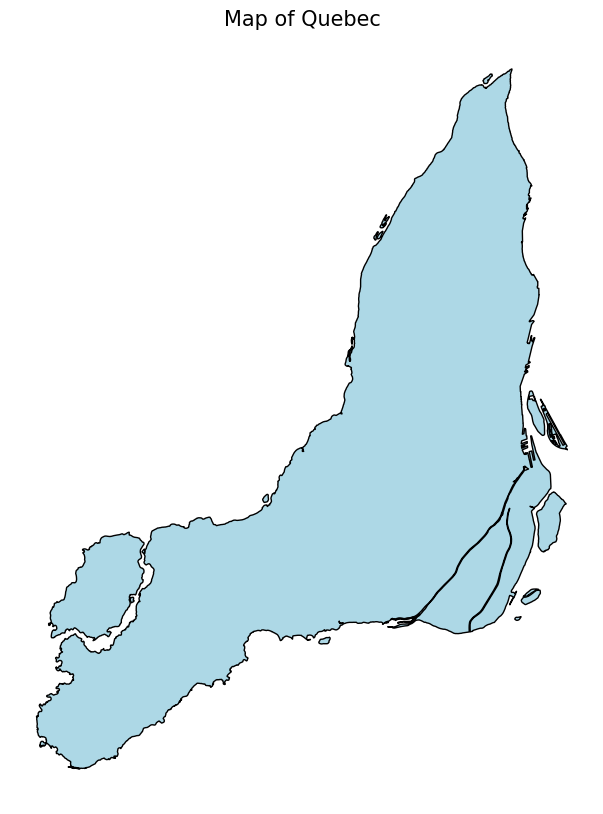

In [21]:
montreal = quebec_full[quebec_full["CDNAME"] == "Montréal"]
fig, ax = plt.subplots(figsize=(10, 10))
montreal.plot(ax=ax, color='lightblue', edgecolor='black')
# Add title and remove axes
ax.set_title('Map of Quebec', fontsize=15)
ax.set_axis_off()
plt.show()

# Creating compatible coordinates sytems to match data with weather files

In [22]:
from pyepw.epw import EPW

In [23]:
epw_file = EPW()
epw_file.read(r"CAN_PQ_Quebec.epw")


In [24]:
for wd in epw_file.weatherdata:
    print (wd.year, wd.month, wd.day, wd.hour, wd.minute, wd.dry_bulb_temperature)

1972 1 1 1 60 -21.5
1972 1 1 2 60 -23.8
1972 1 1 3 60 -25.4
1972 1 1 4 60 -26.3
1972 1 1 5 60 -26.9
1972 1 1 6 60 -27.5
1972 1 1 7 60 -26.1
1972 1 1 8 60 -24.4
1972 1 1 9 60 -23.9
1972 1 1 10 60 -22.2
1972 1 1 11 60 -20.6
1972 1 1 12 60 -18.3
1972 1 1 13 60 -17.8
1972 1 1 14 60 -16.1
1972 1 1 15 60 -15.6
1972 1 1 16 60 -14.4
1972 1 1 17 60 -13.9
1972 1 1 18 60 -13.3
1972 1 1 19 60 -12.2
1972 1 1 20 60 -11.1
1972 1 1 21 60 -11.1
1972 1 1 22 60 -10.6
1972 1 1 23 60 -10.6
1972 1 1 24 60 -10.0
1972 1 2 1 60 -8.3
1972 1 2 2 60 -8.3
1972 1 2 3 60 -8.3
1972 1 2 4 60 -7.8
1972 1 2 5 60 -7.2
1972 1 2 6 60 -7.2
1972 1 2 7 60 -6.1
1972 1 2 8 60 -6.1
1972 1 2 9 60 -5.6
1972 1 2 10 60 -4.4
1972 1 2 11 60 -3.3
1972 1 2 12 60 -3.3
1972 1 2 13 60 -3.3
1972 1 2 14 60 -3.3
1972 1 2 15 60 -2.8
1972 1 2 16 60 -2.2
1972 1 2 17 60 -2.8
1972 1 2 18 60 -2.8
1972 1 2 19 60 -2.8
1972 1 2 20 60 -2.8
1972 1 2 21 60 -2.8
1972 1 2 22 60 -2.8
1972 1 2 23 60 -2.8
1972 1 2 24 60 -2.2
1972 1 3 1 60 -2.8
1972 1 3 2 60 -

In [25]:
epw_file = EPW()
epw_file.read(r"./CWEC_2020_QC/CAN_QC_AMQUI_7050145_CWEC.epw")


In [26]:
epw_file

In [27]:
for wd in epw_file.weatherdata:
    print (wd.year, wd.month, wd.day, wd.hour, wd.minute, wd.dry_bulb_temperature)

2000 1 1 1 0 -19.0
2000 1 1 2 0 -19.1
2000 1 1 3 0 -19.4
2000 1 1 4 0 -19.9
2000 1 1 5 0 -20.4
2000 1 1 6 0 -20.8
2000 1 1 7 0 -21.5
2000 1 1 8 0 -20.5
2000 1 1 9 0 -18.9
2000 1 1 10 0 -16.2
2000 1 1 11 0 -14.5
2000 1 1 12 0 -13.5
2000 1 1 13 0 -13.0
2000 1 1 14 0 -12.1
2000 1 1 15 0 -11.3
2000 1 1 16 0 -10.6
2000 1 1 17 0 -10.1
2000 1 1 18 0 -9.7
2000 1 1 19 0 -9.0
2000 1 1 20 0 -8.1
2000 1 1 21 0 -7.5
2000 1 1 22 0 -7.2
2000 1 1 23 0 -3.8
2000 1 1 24 0 -3.7
2000 1 2 1 0 -4.0
2000 1 2 2 0 -4.2
2000 1 2 3 0 -5.3
2000 1 2 4 0 -6.4
2000 1 2 5 0 -7.7
2000 1 2 6 0 -8.3
2000 1 2 7 0 -8.7
2000 1 2 8 0 -9.4
2000 1 2 9 0 -9.3
2000 1 2 10 0 -8.5
2000 1 2 11 0 -8.6
2000 1 2 12 0 -8.5
2000 1 2 13 0 -7.9
2000 1 2 14 0 -7.8
2000 1 2 15 0 -8.3
2000 1 2 16 0 -8.8
2000 1 2 17 0 -9.0
2000 1 2 18 0 -9.3
2000 1 2 19 0 -9.2
2000 1 2 20 0 -9.2
2000 1 2 21 0 -8.9
2000 1 2 22 0 -9.0
2000 1 2 23 0 -8.1
2000 1 2 24 0 -7.6
2000 1 3 1 0 -6.5
2000 1 3 2 0 -6.7
2000 1 3 3 0 -6.6
2000 1 3 4 0 -6.1
2000 1 3 5 0 -6.0

In [28]:
# Access location data
location = epw_file.location
print(f"City: {location.city}")
print(f"Country: {location.country}")
print(f"Latitude: {location.latitude}")
print(f"Longitude: {location.longitude}")


City: AMQUI
Country: CAN
Latitude: 48.47
Longitude: -67.43


In [29]:
quebec = canada_provinces[canada_provinces['CDUID'] == '2443']
multi_poly = quebec["geometry"]

In [50]:
quebec = canada_provinces[canada_provinces['PRUID'] == '24']


In [52]:
quebec

,CDUID,CDNAME,CDTYPE,PRUID,PRNAME,geometry
56,2447,La Haute-Yamaska,MRC,24,Quebec / Québec,"POLYGON ((7703435.44 1270659.02, 7703893.906 1..."
58,2448,Acton,MRC,24,Quebec / Québec,"POLYGON ((7696853.534 1297533.954, 7697625.571..."
59,2449,Drummond,MRC,24,Quebec / Québec,"POLYGON ((7692635.469 1331760.823, 7692815.651..."
60,2450,Nicolet-Yamaska,MRC,24,Quebec / Québec,"MULTIPOLYGON (((7698386.983 1353046.249, 76985..."
61,2451,Maskinongé,MRC,24,Quebec / Québec,"POLYGON ((7609943.971 1400733.551, 7610706.374..."
...,...,...,...,...,...,...
206,2442,Le Val-Saint-François,MRC,24,Quebec / Québec,"POLYGON ((7742154.274 1302329.923, 7742628.8 1..."
207,2443,Sherbrooke,TÉ,24,Quebec / Québec,"POLYGON ((7758241.006 1284358.229, 7759130.706..."
208,2444,Coaticook,MRC,24,Quebec / Québec,"POLYGON ((7785707.011 1264988.411, 7785729.654..."
209,2445,Memphrémagog,MRC,24,Quebec / Québec,"MULTIPOLYGON (((7738510.097 1271049.24, 773916..."


AS you can see here, the orginal file is some UTM coordinate file that does not fit well with the CWEC format : from CHATGPT-


CWEC (Canadian Weather for Energy Calculations) files use geographical coordinates for location specification, which is based on the World Geodetic System (WGS84). This is a standard coordinate system for Earth used in GPS, mapping, and weather files.

PROJCS["PCS_Lambert_Conformal_Conic",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",63.390675],PARAMETER["central_meridian",-91.8666666666667],PARAMETER["standard_parallel_1",49],PARAMETER["standard_parallel_2",77],PARAMETER["false_easting",6200000],PARAMETER["false_northing",3000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


<Axes: >

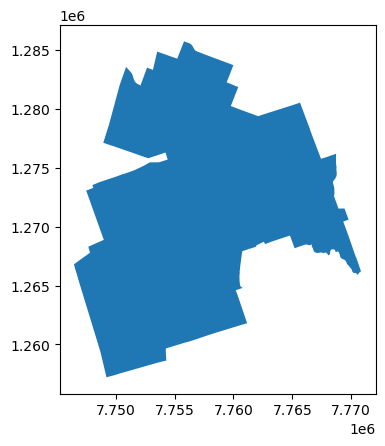

In [31]:
print(quebec.crs)
multi_poly.plot()

### you we are going to transform the system to World Geodetic System (WGS84), with the code of epsg=4326

<Axes: >

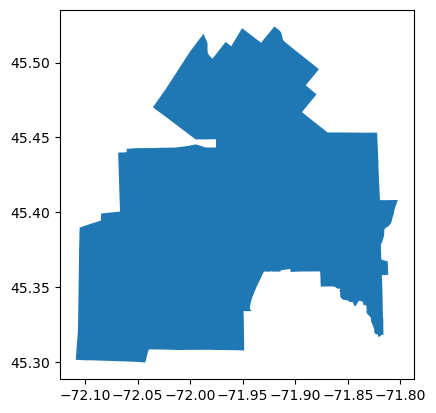

In [32]:
new_quebs = quebec.to_crs(epsg=4326)
new_quebs.plot()

<Axes: >

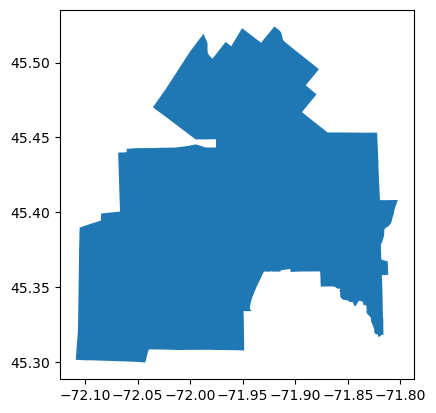

In [33]:
new_quebs.plot()

### now for the full of quebec

In [34]:
quebec_full_WGS = quebec_full.to_crs(epsg=4326)

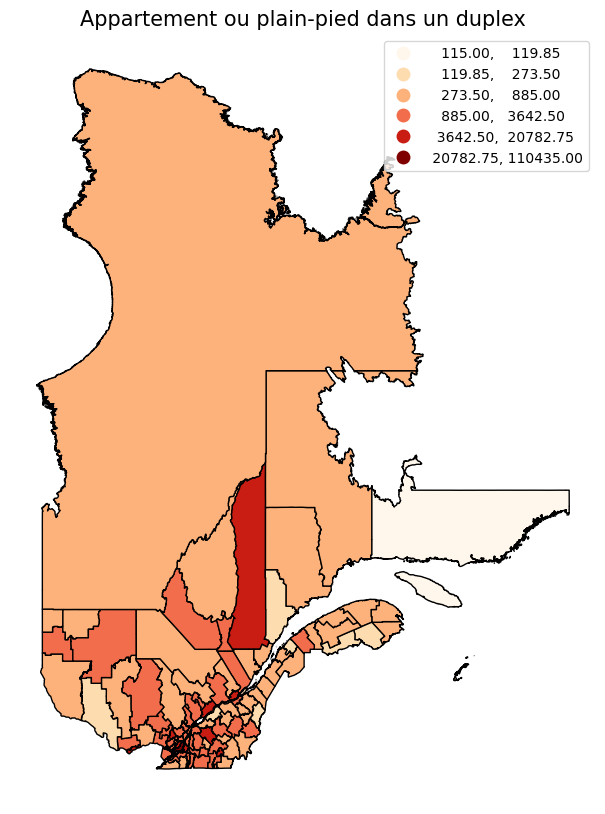

In [35]:
quebec_full_WGS = quebec_full.to_crs(epsg=4326)
fig, ax = plt.subplots(figsize=(10, 10))
quebec_full_WGS.plot(column = "Appartement ou plain-pied dans un duplex", ax=ax, cmap='OrRd',scheme='percentiles', edgecolor='black',legend=True)
# Add title and remove axes
ax.set_title('Appartement ou plain-pied dans un duplex', fontsize=15)
ax.set_axis_off()
plt.show()

## dealing with the EPW files, but we will later deal with the CWEC files 

In [36]:
### we have the individual EPW files for every station, and now everything should be compatible for cross database usage

In [1]:
import pandas as pd

weather_station_files = "D:\\PI4_main\\CWEEDS_2020_stns_all_REV_20210324.csv"
# Read CSV file into a DataFrame
df = pd.read_csv(weather_station_files)

# Display the first few rows of the DataFrame
print(df.head())

C:\Users\xuebi\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


      version           name prov country climate_ID    lat     lon  \
0  CWEEDS2011      ABEE AGDM   AB     CAN    3010010  54.28 -112.97   
1  CWEEDS2011    ANDREW AGDM   AB     CAN    3010237  53.92 -112.28   
2  CWEEDS2011    ATMORE AGDM   AB     CAN    3060406  54.78 -112.82   
3  CWEEDS2011       BANFF CS   AB     CAN    3050519  51.19 -115.55   
4  CWEEDS2011  BARNWELL AGDM   AB     CAN    3030525  49.80 -112.30   

   UTC_offset  elev(m)  first_yr  last_yr  
0          -7    664.0      2003     2017  
1          -7    625.0      2003     2017  
2          -7    574.0      2003     2017  
3          -7   1396.9      1998     2017  
4          -7    824.2      2003     2017  


In [38]:
quebec_stations_reference = df[df["prov"] == "QC"]

In [39]:
quebec_stations_reference

,version,name,prov,country,climate_ID,lat,lon,UTC_offset,elev(m),first_yr,last_yr
425,CWEEDS2011,AMQUI,QC,CAN,7050145,48.47,-67.43,-5,166.0,1998,2017
426,CWEEDS2011,BAGOTVILLE A,QC,CAN,7060400,48.33,-71.00,-5,159.1,1998,2017
427,CWEEDS2011,BAIE-COMEAU A,QC,CAN,7040442,49.13,-68.20,-5,21.6,1998,2017
428,CWEEDS2011,BAIE-COMEAU,QC,CAN,704S001,49.26,-68.15,-5,129.5,1998,2017
429,CWEEDS2011,BARRAGE TEMISCAMINGUE,QC,CAN,7080468,46.71,-79.10,-5,181.4,1998,2017
...,...,...,...,...,...,...,...,...,...,...,...
501,CWEEDS2011,STE-ANNE-DE-BELLEVUE 1,QC,CAN,702FHL8,45.43,-73.93,-5,39.0,1998,2017
502,CWEEDS2011,STE-CLOTHILDE,QC,CAN,7027039,45.17,-73.68,-5,53.0,1998,2017
503,CWEEDS2011,STE-FOY (U. LAVAL),QC,CAN,701Q004,46.78,-71.29,-5,91.4,1998,2017
504,CWEEDS2011,VAL-D'OR,QC,CAN,7098603,48.06,-77.79,-5,338.9,1998,2017


Text(0.5, 1.0, 'Appartement ou plain-pied dans un duplex')

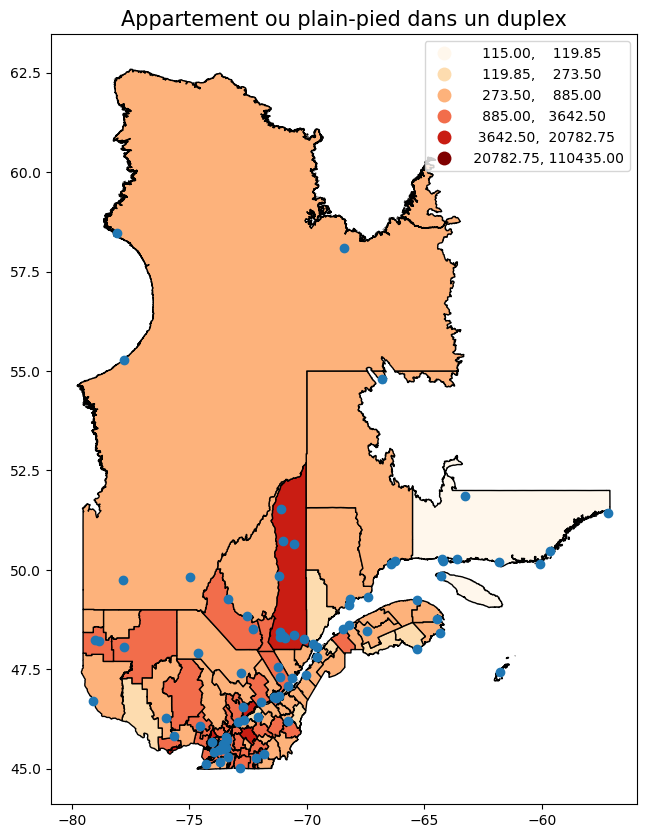

In [40]:
fig, ax = plt.subplots(figsize=(10, 10))
quebec_full_WGS.plot(column = "Appartement ou plain-pied dans un duplex", ax=ax, cmap='OrRd',scheme='percentiles', edgecolor='black',legend=True)
# Add title and remove axes
coors_stations = quebec_stations_reference[["lat","lon"]]
ax.scatter(coors_stations["lon"], coors_stations["lat"])
ax.set_title('Appartement ou plain-pied dans un duplex', fontsize=15)


# ax.set_axis_off()
# plt.show()



In [41]:
coors_stations = quebec_stations_reference[["lat","lon"]]

In [42]:
df

,version,name,prov,country,climate_ID,lat,lon,UTC_offset,elev(m),first_yr,last_yr
0,CWEEDS2011,ABEE AGDM,AB,CAN,3010010,54.28,-112.97,-7,664.0,2003,2017
1,CWEEDS2011,ANDREW AGDM,AB,CAN,3010237,53.92,-112.28,-7,625.0,2003,2017
2,CWEEDS2011,ATMORE AGDM,AB,CAN,3060406,54.78,-112.82,-7,574.0,2003,2017
3,CWEEDS2011,BANFF CS,AB,CAN,3050519,51.19,-115.55,-7,1396.9,1998,2017
4,CWEEDS2011,BARNWELL AGDM,AB,CAN,3030525,49.80,-112.30,-7,824.2,2003,2017
...,...,...,...,...,...,...,...,...,...,...,...
559,CWEEDS2011,OLD CROW RCS,YT,CAN,2100805,67.57,-139.84,-8,251.2,2005,2017
560,CWEEDS2011,ROCK RIVER,YT,CAN,2100935,66.98,-136.22,-8,731.0,2007,2017
561,CWEEDS2011,TESLIN (AUT),YT,CAN,2101102,60.17,-132.73,-8,705.0,2005,2017
562,CWEEDS2011,WATSON LAKE A,YT,CAN,2101201,60.12,-128.82,-8,687.3,2005,2017


In [43]:
quebec_full_WGS

,CDUID,CDNAME,CDTYPE,PRUID,PRNAME,geometry,Maison individuelle non attenante,Maison jumelée,Maison en rangée,Appartement ou plain-pied dans un duplex,Appartement dans un immeuble de moins de cinq étages,Appartement dans un immeuble de cinq étages ou plus
56,2447,La Haute-Yamaska,MRC,24,Quebec / Québec,"POLYGON ((-72.60701 45.53762, -72.60611 45.526...",19880,2955,540,2625,13630,515
58,2448,Acton,MRC,24,Quebec / Québec,"POLYGON ((-72.58505 45.78258, -72.5769 45.7778...",4910,240,90,340,1090,0
59,2449,Drummond,MRC,24,Quebec / Québec,"POLYGON ((-72.50598 46.08385, -72.50394 46.083...",26590,2435,830,3660,13730,490
60,2450,Nicolet-Yamaska,MRC,24,Quebec / Québec,"MULTIPOLYGON (((-72.35386 46.24893, -72.3519 4...",7740,405,70,455,1680,0
61,2451,Maskinongé,MRC,24,Quebec / Québec,"POLYGON ((-73.26325 46.88718, -73.25424 46.884...",13315,340,160,925,2300,0
...,...,...,...,...,...,...,...,...,...,...,...,...
206,2442,Le Val-Saint-François,MRC,24,Quebec / Québec,"POLYGON ((-72.01948 45.70144, -72.01442 45.698...",9885,320,85,1025,2160,0
207,2443,Sherbrooke,TÉ,24,Quebec / Québec,"POLYGON ((-71.89602 45.50587, -71.88665 45.500...",29730,4115,2385,4530,36655,2445
208,2444,Coaticook,MRC,24,Quebec / Québec,"POLYGON ((-71.64346 45.26714, -71.64344 45.266...",5755,230,65,470,1485,0
209,2445,Memphrémagog,MRC,24,Quebec / Québec,"MULTIPOLYGON (((-72.18404 45.44723, -72.18416 ...",17495,835,435,1400,5045,40


### finding the center of a multipolygon

thanks to the multipolygon library, we can easily get the geometric data of many centers.

Simple computation of the closest weather stations to choose the closest one

In [44]:
montreal = quebec_full[quebec_full["CDNAME"] == "Québec"].to_crs(epsg=4326)
differenec_coords = coors_stations-np.array(montreal.to_crs(epsg=4326).geometry.centroid.iloc[0].coords[0])[::-1]
distances_array = differenec_coords["lat"]**2 + differenec_coords["lon"]**2
distances_array = distances_array.sort_values()
minmum_index = distances_array.iloc[0:3].index
station_coordinates = coors_stations.loc[minmum_index]

C:\Users\xuebi\AppData\Local\Temp\ipykernel_17056\1476210363.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  differenec_coords = coors_stations-np.array(montreal.to_crs(epsg=4326).geometry.centroid.iloc[0].coords[0])[::-1]


it normally also works for multiple polygons (the example above simply uses a single polygon). We can therfore choose our weather station in function of the centroid

C:\Users\xuebi\AppData\Local\Temp\ipykernel_17056\2590183922.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  montreal.geometry.centroid.plot(ax = ax, color = "g",label = "Centroid of geometry")


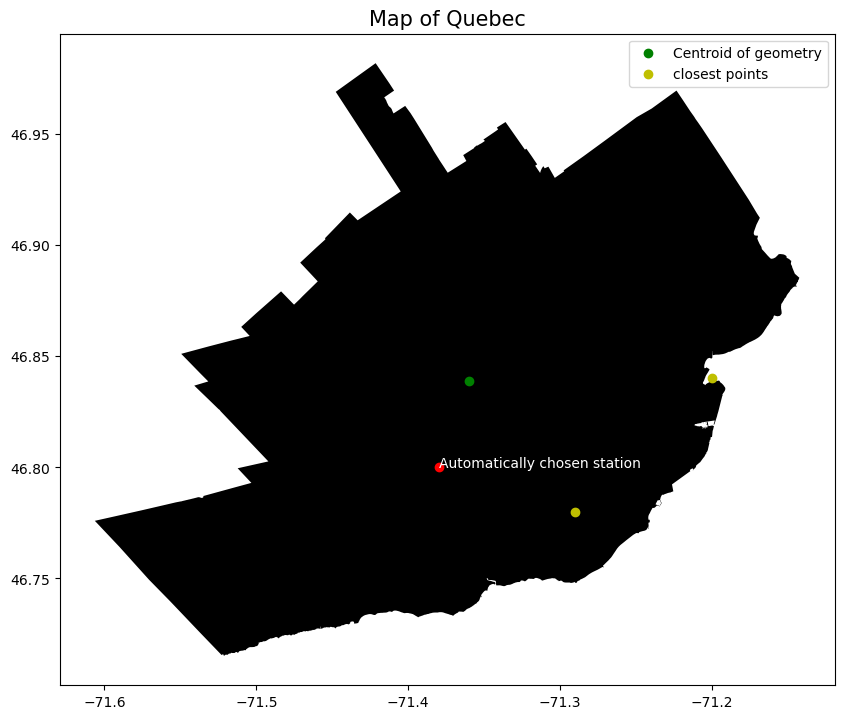

In [45]:
fig, ax = plt.subplots(figsize=(10, 10))
montreal.plot(ax=ax, color = "black")
montreal.geometry.centroid.plot(ax = ax, color = "g",label = "Centroid of geometry")
ax.scatter(station_coordinates["lon"].iloc[1:], station_coordinates["lat"].iloc[1:], color = "y", label = "closest points")
ax.scatter(station_coordinates["lon"].iloc[0], station_coordinates["lat"].iloc[0], color = "r")
ax.text(station_coordinates["lon"].iloc[0], station_coordinates["lat"].iloc[0], "Automatically chosen station", color = "white")

# Add title and remove axes
ax.set_title('Map of Quebec', fontsize=15)
ax.legend()
plt.show()

In [46]:
quebec_full_WGS

,CDUID,CDNAME,CDTYPE,PRUID,PRNAME,geometry,Maison individuelle non attenante,Maison jumelée,Maison en rangée,Appartement ou plain-pied dans un duplex,Appartement dans un immeuble de moins de cinq étages,Appartement dans un immeuble de cinq étages ou plus
56,2447,La Haute-Yamaska,MRC,24,Quebec / Québec,"POLYGON ((-72.60701 45.53762, -72.60611 45.526...",19880,2955,540,2625,13630,515
58,2448,Acton,MRC,24,Quebec / Québec,"POLYGON ((-72.58505 45.78258, -72.5769 45.7778...",4910,240,90,340,1090,0
59,2449,Drummond,MRC,24,Quebec / Québec,"POLYGON ((-72.50598 46.08385, -72.50394 46.083...",26590,2435,830,3660,13730,490
60,2450,Nicolet-Yamaska,MRC,24,Quebec / Québec,"MULTIPOLYGON (((-72.35386 46.24893, -72.3519 4...",7740,405,70,455,1680,0
61,2451,Maskinongé,MRC,24,Quebec / Québec,"POLYGON ((-73.26325 46.88718, -73.25424 46.884...",13315,340,160,925,2300,0
...,...,...,...,...,...,...,...,...,...,...,...,...
206,2442,Le Val-Saint-François,MRC,24,Quebec / Québec,"POLYGON ((-72.01948 45.70144, -72.01442 45.698...",9885,320,85,1025,2160,0
207,2443,Sherbrooke,TÉ,24,Quebec / Québec,"POLYGON ((-71.89602 45.50587, -71.88665 45.500...",29730,4115,2385,4530,36655,2445
208,2444,Coaticook,MRC,24,Quebec / Québec,"POLYGON ((-71.64346 45.26714, -71.64344 45.266...",5755,230,65,470,1485,0
209,2445,Memphrémagog,MRC,24,Quebec / Québec,"MULTIPOLYGON (((-72.18404 45.44723, -72.18416 ...",17495,835,435,1400,5045,40


In [110]:
for index, row in quebec_full_WGS.iterrows():
    differenec_coords = coors_stations-np.array(row.geometry.centroid.coords[0])[::-1]
    distances_array = differenec_coords["lat"]**2 + differenec_coords["lon"]**2
    distances_array = distances_array.sort_values()
    minmum_index = distances_array.iloc[:1].index
    quebec_full_WGS.at[index, "weather_index"] = minmum_index

In [111]:
coor_filter = coors_stations.loc[quebec_full_WGS["weather_index"]]

C:\Users\xuebi\AppData\Local\Temp\ipykernel_24456\3636186768.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  quebec_full_WGS.geometry.centroid.plot(ax = ax, markersize = 10,label = "centroids")


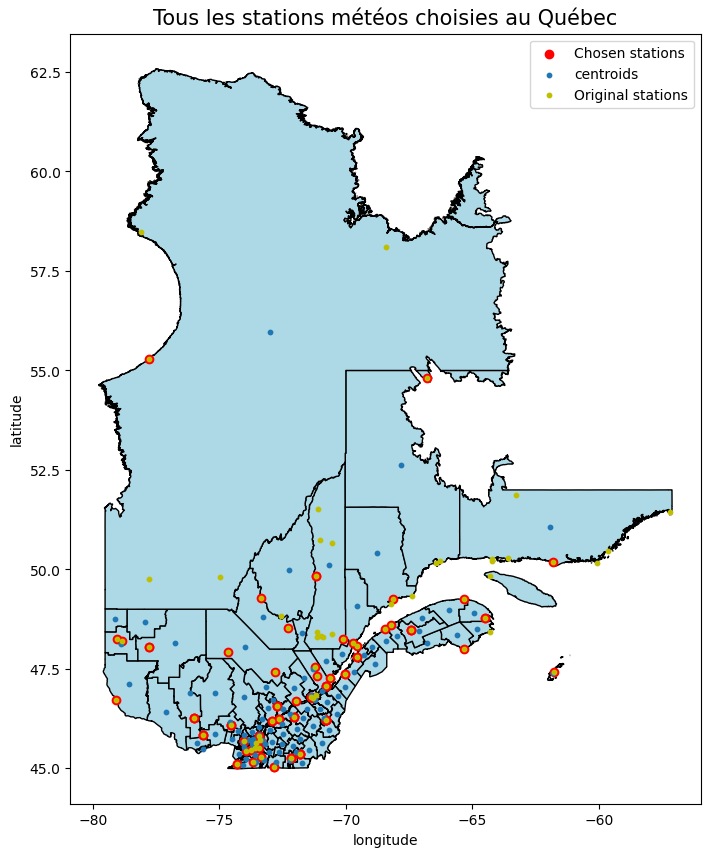

In [112]:
fig, ax = plt.subplots(figsize=(10, 10))
# quebec_full_WGS.plot(column = "Appartement ou plain-pied dans un duplex", ax=ax, cmap='OrRd',scheme='percentiles', edgecolor='black',legend=True)
quebec_full_WGS.plot(ax = ax, color = "lightblue",edgecolor='black')
# Add title and remove axes
coors_stations = quebec_stations_reference[["lat","lon"]]
ax.scatter(coor_filter["lon"], coor_filter["lat"], color = "r", label = "Chosen stations")
ax.set_title('Tous les stations météos choisies au Québec', fontsize=15)
quebec_full_WGS.geometry.centroid.plot(ax = ax, markersize = 10,label = "centroids")
ax.scatter(coors_stations["lon"], coors_stations["lat"], s = 10, color = "y", label = "Original stations")
ax.legend()
ax.set_xlabel("longitude")
ax.set_ylabel("latitude")

# ax.set_axis_off()
plt.show()



### how many total stations do we end up having?

In [59]:
coor_filter.index.unique().shape

(54,)

## Quick extraction of the population DATA

In [144]:
shapefile_path = './lcd_000b21a_e/lcd_000b21a_e.shp'
canada_provinces = gpd.read_file(shapefile_path)
new_21_quebec = canada_provinces[canada_provinces["PRUID"] == "24"]

In [145]:
pop_data = pd.read_csv('./data_extraction/population_data_QC.csv')

In [146]:
pop_data["CDUID"] = 0

In [147]:
for index, row in pop_data.iterrows():
    pop_data.at[index,"CDUID"] = new_21_quebec[new_21_quebec["CDNAME"] == row["Geographic name"]]["CDUID"]._values[0]

C:\Users\xuebi\AppData\Local\Temp\ipykernel_24720\1437308863.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2488' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  pop_data.at[index,"CDUID"] = new_21_quebec[new_21_quebec["CDNAME"] == row["Geographic name"]]["CDUID"]._values[0]


In [148]:
pop_data

,Geographic name,Geographic area type abbreviation,Province or territory abbreviation,Population,CDUID
0,Abitibi,MRC,Que.,"24,764",2488
1,Abitibi-Ouest,MRC,Que.,"20,526",2487
2,Acton,MRC,Que.,"15,654",2448
3,Antoine-Labelle,MRC,Que.,"36,462",2479
4,Argenteuil,MRC,Que.,"34,752",2476
...,...,...,...,...,...
93,Sherbrooke,TÉ,Que.,"172,950",2443
94,Thérèse-De Blainville,MRC,Que.,"163,632",2473
95,Témiscamingue,MRC,Que.,"16,132",2485
96,Témiscouata,MRC,Que.,"19,492",2413


# optimisation methods

## Genetic Algorithms


The gene mutation algorithm is based on mutation and elite reproduction (evolution)

In [30]:
# Python3 program to create target string, starting from 
# random string using Genetic Algorithm 
least_cost = []  
import random 
  
# Number of individuals in each generation 
POPULATION_SIZE = 20
  
# Valid genes 
GENES = '''abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOP 
QRSTUVWXYZ 1234567890, .-;:_!"#%&/()=?@${[]}'''
  
# Target string to be generated 
TARGET = "There seems to be a lack of understanding between departments. Nevertheless I expect great things from you, Raymond X Xue"
  
class Individual(object): 
    ''' 
    Class representing individual in population 
    '''
    def __init__(self, chromosome): 
        self.chromosome = chromosome  
        self.fitness = self.cal_fitness() 
  
    @classmethod
    def mutated_genes(self): 
        ''' 
        create random genes for mutation 
        '''
        global GENES 
        gene = random.choice(GENES) 
        return gene 
  
    @classmethod
    def create_gnome(self): 
        ''' 
        create chromosome or string of genes 
        '''
        global TARGET 
        gnome_len = len(TARGET) 
        return [self.mutated_genes() for _ in range(gnome_len)] 
  
    def mate(self, par2): 
        ''' 
        Perform mating and produce new offspring 
        '''
  
        # chromosome for offspring 
        child_chromosome = [] 
        for gp1, gp2 in zip(self.chromosome, par2.chromosome):     
  
            # random probability   
            prob = random.random() 
  
            # if prob is less than 0.45, insert gene 
            # from parent 1  
            if prob < 0.45: 
                child_chromosome.append(gp1) 
  
            # if prob is between 0.45 and 0.90, insert 
            # gene from parent 2 
            elif prob < 0.95: 
                child_chromosome.append(gp2) 
  
            # otherwise insert random gene(mutate),  
            # for maintaining diversity 
            else: 
                child_chromosome.append(self.mutated_genes()) 
  
        # create new Individual(offspring) using  
        # generated chromosome for offspring 
        return Individual(child_chromosome) 
  
    def cal_fitness(self): 
        ''' 
        Calculate fitness score, it is the number of 
        characters in string which differ from target 
        string. 
        '''
        global TARGET 
        fitness = 0
        for gs, gt in zip(self.chromosome, TARGET): 
            if gs != gt: fitness+= 1
        return fitness 
  
# Driver code 

global POPULATION_SIZE
global least_cost 

#current generation 
generation = 1

found = False
population = [] 

# create initial population 
for _ in range(POPULATION_SIZE): 
            gnome = Individual.create_gnome() 
            population.append(Individual(gnome)) 

while not found: 

    # sort the population in increasing order of fitness score 
    population = sorted(population, key = lambda x:x.fitness) 

    # if the individual having lowest fitness score ie.  
    # 0 then we know that we have reached to the target 
    # and break the loop 
    if population[0].fitness <= 0: 
        found = True
        break

    # Otherwise generate new offsprings for new generation 
    new_generation = [] 

    # Perform Elitism, that mean 10% of fittest population 
    # goes to the next generation 
    s = int((10*POPULATION_SIZE)/100) 
    new_generation.extend(population[:s]) 

    # From 50% of fittest population, Individuals  
    # will mate to produce offspring 
    s = int((90*POPULATION_SIZE)/100) 
    for _ in range(s): 
        parent1 = random.choice(population[:50]) 
        parent2 = random.choice(population[:50]) 
        child = parent1.mate(parent2) 
        new_generation.append(child) 

    population = new_generation 

    print("Generation: {}\tString: {}\tFitness: {}". 
          format(generation, 
          "".join(population[0].chromosome), 
          population[0].fitness)) 
    least_cost.append(population[0].fitness)

    generation += 1


print("Generation: {}\tString: {}\tFitness: {}". 
      format(generation, 
      "".join(population[0].chromosome), 
      population[0].fitness)) 
least_cost.append(population[0].fitness)



Generation: 1	String: Oj]gY?:upF6
z-fG[t!S_De"%"zXX4 VTj63 k?FDp)91(#hBEM}:Kn)4ANy=cQ,xKJ &[eK%ueJ$m}05Cpz D](C] Xi83cRn8z2mv,3Cbd?kkhp
GS3Czu#	Fitness: 116
Generation: 2	String: .Kae8[Qpj5RYtA?]?8RZQ0[gprd__1dZBnta iDJDu:=aE,oqQ",%.rH]6x$az JE=#Z
#N)L?p}2n$W
@fTqKOKA.$/N.:$oA/zTJBeNh-)q:/B23UNcg)z=	Fitness: 115
Generation: 3	String: .Kae8[Qpj5RYtA?]?8RZQ0[gprd__1dZBnta iDJDu:=aE,oqQ",%.rH]6x$az JE=#Z
#N)L?p}2n$W
@fTqKOKA.$/N.:$oA/zTJBeNh-)q:/B23UNcg)z=	Fitness: 115
Generation: 4	String: .Kae8[Qpj5RYtA?]?8RZQ0[gprd__1dZBnta iDJDu:=aE,oqQ",%.rH]6x$az JE=#Z
#N)L?p}2n$W
@fTqKOKA.$/N.:$oA/zTJBeNh-)q:/B23UNcg)z=	Fitness: 115
Generation: 5	String: .Kae8[Qpj5RYtA?]?8RZQ0[gprd__1dZBnta iDJDu:=aE,oqQ",%.rH]6x$az JE=#Z
#N)L?p}2n$W
@fTqKOKA.$/N.:$oA/zTJBeNh-)q:/B23UNcg)z=	Fitness: 115
Generation: 6	String: .Kae8[Qpj5RYtA?]?8RZQ0[gprd__1dZBnta iDJDu:=aE,oqQ",%.rH]6x$az JE=#Z
#N)L?p}2n$W
@fTqKOKA.$/N.:$oA/zTJBeNh-)q:/B23UNcg)z=	Fitness: 115
Generation: 7	String: .K]I
c:"C{& z;pWptHEQgz qrc?6d.CrnZa

Generation: 256	String: jh]C;lr0rm, to #5VR1Sts6xonXTnC&:s3a2mowgLHBtl?jDKf2WlrIl"A ,] ?.vWru/ef0?@QenK$ax9[k-#bY3 B!z $D z.
q 9;TtAv08=1
U -,{ir	Fitness: 100
Generation: 257	String: jh]C;lr0rm, to #5VR1Sts6xonXTnC&:s3a2mowgLHBtl?jDKf2WlrIl"A ,] ?.vWru/ef0?@QenK$ax9[k-#bY3 B!z $D z.
q 9;TtAv08=1
U -,{ir	Fitness: 100
Generation: 258	String: jh]C;lr0rm, to #5VR1Sts6xonXTnC&:s3a2mowgLHBtl?jDKf2WlrIl"A ,] ?.vWru/ef0?@QenK$ax9[k-#bY3 B!z $D z.
q 9;TtAv08=1
U -,{ir	Fitness: 100
Generation: 259	String: jh]C;lr0rm, to #5VR1Sts6xonXTnC&:s3a2mowgLHBtl?jDKf2WlrIl"A ,] ?.vWru/ef0?@QenK$ax9[k-#bY3 B!z $D z.
q 9;TtAv08=1
U -,{ir	Fitness: 100
Generation: 260	String: jh]C;lr0rm, to #5VR1Sts6xonXTnC&:s3a2mowgLHBtl?jDKf2WlrIl"A ,] ?.vWru/ef0?@QenK$ax9[k-#bY3 B!z $D z.
q 9;TtAv08=1
U -,{ir	Fitness: 100
Generation: 261	String: jh]C;lr0rm, to #5VR1Sts6xonXTnC&:s3a2mowgLHBtl?jDKf2WlrIl"A ,] ?.vWru/ef0?@QenK$ax9[k-#bY3 B!z $D z.
q 9;TtAv08=1
U -,{ir	Fitness: 100
Generation: 262	String: jh]C;lr0rm, to #5VR1St

Generation: 531	String:  hMC;lr0rm, to X5Wy St$VAonXTnC6:s3a2songLnBtlvU"Wf2Wlr(l"A$R] N.vWou?e"e;@Q3SK$a#=[3-#%D3 BIzpqz e.
q 9;Rtyv0Lo7
U -HB7r	Fitness: 97
Generation: 532	String:  hMC;lr0rm, to X5Wy St$VAonXTnC6:s3a2songLnBtlvU"Wf2Wlr(l"A$R] N.vWou?e"e;@Q3SK$a#=[3-#%D3 BIzpqz e.
q 9;Rtyv0Lo7
U -HB7r	Fitness: 97
Generation: 533	String:  hMC;lr0rm, to X5Wy St$VAonXTnC6:s3a2songLnBtlvU"Wf2Wlr(l"A$R] N.vWou?e"e;@Q3SK$a#=[3-#%D3 BIzpqz e.
q 9;Rtyv0Lo7
U -HB7r	Fitness: 97
Generation: 534	String:  hMC;lr0rm, to X5Wy St$VAonXTnC6:s3a2songLnBtlvU"Wf2Wlr(l"A$R] N.vWou?e"e;@Q3SK$a#=[3-#%D3 BIzpqz e.
q 9;Rtyv0Lo7
U -HB7r	Fitness: 97
Generation: 535	String:  hMC;lr0rm, to X5Wy St$VAonXTnC6:s3a2songLnBtlvU"Wf2Wlr(l"A$R] N.vWou?e"e;@Q3SK$a#=[3-#%D3 BIzpqz e.
q 9;Rtyv0Lo7
U -HB7r	Fitness: 97
Generation: 536	String:  hMC;lr0rm, to X5Wy St$VAonXTnC6:s3a2songLnBtlvU"Wf2Wlr(l"A$R] N.vWou?e"e;@Q3SK$a#=[3-#%D3 BIzpqz e.
q 9;Rtyv0Lo7
U -HB7r	Fitness: 97
Generation: 537	String:  hMC;lr0rm, to X5Wy St$VAonX

Generation: 826	String: dhGo&6eerm, to0=Qwe lg]  -f7jnL)7s3aq
o/gluBtQe=qH1x9xr(@K9tR6 N!vzoufepei@x SISu%}t gj:Rk ?wz1qI wnEq m;rtW#=LT73U ZH 7"	Fitness: 91
Generation: 827	String: dhGo&6eerm, to0=Qwe lg]  -f7jnL)7s3aq
o/gluBtQe=qH1x9xr(@K9tR6 N!vzoufepei@x SISu%}t gj:Rk ?wz1qI wnEq m;rtW#=LT73U ZH 7"	Fitness: 91
Generation: 828	String: dhGo&6eerm, to0=Qwe lg]  -f7jnL)7s3aq
o/gluBtQe=qH1x9xr(@K9tR6 N!vzoufepei@x SISu%}t gj:Rk ?wz1qI wnEq m;rtW#=LT73U ZH 7"	Fitness: 91
Generation: 829	String: dhGo&6eerm, to0=Qwe lg]  -f7jnL)7s3aq
o/gluBtQe=qH1x9xr(@K9tR6 N!vzoufepei@x SISu%}t gj:Rk ?wz1qI wnEq m;rtW#=LT73U ZH 7"	Fitness: 91
Generation: 830	String: dhGo&6eerm, to0=Qwe lg]  -f7jnL)7s3aq
o/gluBtQe=qH1x9xr(@K9tR6 N!vzoufepei@x SISu%}t gj:Rk ?wz1qI wnEq m;rtW#=LT73U ZH 7"	Fitness: 91
Generation: 831	String: dhGo&6eerm, to0=Qwe lg]  -f7jnL)7s3aq
o/gluBtQe=qH1x9xr(@K9tR6 N!vzoufepei@x SISu%}t gj:Rk ?wz1qI wnEq m;rtW#=LT73U ZH 7"	Fitness: 91
Generation: 832	String: dhGo&6eerm, to0=Qwe lg]  -f7

Generation: 1049	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1050	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1051	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1052	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1053	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1054	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1055	String: dhgo&6rerm, to0=Qi" l

Generation: 1282	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1283	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1284	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1285	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1286	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1287	String: dhgo&6rerm, to0=Qi" lg]  of7jnL)7s$aq
o/gluBtQe=qH1x9xr(QK&tR6 N!vzoufepei@  SISu%}t g6:Rk (wz1qI wR2q m;:tW;0LK73U ZHB "	Fitness: 89
Generation: 1288	String: dhgo&6rerm, to0=Qi" l

Generation: 1497	String: dhgo?6rerm, to0=Qi" lg]  of7jn@)7s$aq
o/gluBt=e=nH1xDxr(QK tR6 N!vzoufelei@  SISu%}t g6:Rk (wz1qI ;R2q m7:tW;0LK7%U 8HB "	Fitness: 87
Generation: 1498	String: dhgo?6rerm, to0=Qi" lg]  of7jn@)7s$aq
o/gluBt=e=nH1xDxr(QK tR6 N!vzoufelei@  SISu%}t g6:Rk (wz1qI ;R2q m7:tW;0LK7%U 8HB "	Fitness: 87
Generation: 1499	String: dhgo?6rerm, to0=Qi" lg]  of7jn@)7s$aq
o/gluBt=e=nH1xDxr(QK tR6 N!vzoufelei@  SISu%}t g6:Rk (wz1qI ;R2q m7:tW;0LK7%U 8HB "	Fitness: 87
Generation: 1500	String: dhgo?6rerm, to0=Qi" lg]  of7jn@)7s$aq
o/gluBt=e=nH1xDxr(QK tR6 N!vzoufelei@  SISu%}t g6:Rk (wz1qI ;R2q m7:tW;0LK7%U 8HB "	Fitness: 87
Generation: 1501	String: dhgo?6rerm, to0=Qi" lg]  of7jn@)7s$aq
o/gluBt=e=nH1xDxr(QK tR6 N!vzoufelei@  SISu%}t g6:Rk (wz1qI ;R2q m7:tW;0LK7%U 8HB "	Fitness: 87
Generation: 1502	String: dhgo?6rerm, to0=Qi" lg]  of7jn@)7s$aq
o/gluBt=e=nH1xDxr(QK tR6 N!vzoufelei@  SISu%}t g6:Rk (wz1qI ;R2q m7:tW;0LK7%U 8HB "	Fitness: 87
Generation: 1503	String: dhgo?6rerm, to0=Qi" l

Generation: 1721	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1722	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1723	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1724	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1725	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1726	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1727	String: dhgo?6reem, to0=Qi" l

Generation: 1968	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1969	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1970	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1971	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1972	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1973	String: dhgo?6reem, to0=Qi" lg]  of7jn@}7s$aq/o3g uBtQe=nHRxDxr(QK tR6 N!&zouNelei@  SISu%}t g6:Rk (wz1qI ;R2R m):tW;0LKH%F ?H" "	Fitness: 86
Generation: 1974	String: dhgo?6reem, to0=Qi" l

Generation: 2351	String: dhgo?6Teem, to0=Qi" lg]  of7jn@}7s$aqRoag uBtze=nHRxDxr(QK tR6 N!&zruNelei@ HSISu%}t g6:Rk (wZ1qI ;R2R m):tW;0L7H%F ?Hs "	Fitness: 85
Generation: 2352	String: dhgo?6Teem, to0=Qi" lg]  of7jn@}7s$aqRoag uBtze=nHRxDxr(QK tR6 N!&zruNelei@ HSISu%}t g6:Rk (wZ1qI ;R2R m):tW;0L7H%F ?Hs "	Fitness: 85
Generation: 2353	String: dhgo?6Teem, to0=Qi" lg]  of7jn@}7s$aqRoag uBtze=nHRxDxr(QK tR6 N!&zruNelei@ HSISu%}t g6:Rk (wZ1qI ;R2R m):tW;0L7H%F ?Hs "	Fitness: 85
Generation: 2354	String: dhgo?6Teem, to0=Qi" lg]  of7jn@}7s$aqRoag uBtze=nHRxDxr(QK tR6 N!&zruNelei@ HSISu%}t g6:Rk (wZ1qI ;R2R m):tW;0L7H%F ?Hs "	Fitness: 85
Generation: 2355	String: dhgo?6Teem, to0=Qi" lg]  of7jn@}7s$aqRoag uBtze=nHRxDxr(QK tR6 N!&zruNelei@ HSISu%}t g6:Rk (wZ1qI ;R2R m):tW;0L7H%F ?Hs "	Fitness: 85
Generation: 2356	String: dhgo?6Teem, to0=Qi" lg]  of7jn@}7s$aqRoag uBtze=nHRxDxr(QK tR6 N!&zruNelei@ HSISu%}t g6:Rk (wZ1qI ;R2R m):tW;0L7H%F ?Hs "	Fitness: 85
Generation: 2357	String: dhgo?6Teem, to0=Qi" l

Generation: 2720	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2721	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2722	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2723	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2724	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2725	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2726	String: dhgowkTeem, to0=Qi" l

Generation: 2958	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2959	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2960	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2961	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2962	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2963	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr(QK to9 N4&zruNelei@ HSIS]Z}t g6:ck (w61qI ;R2R =):tW;03-H%F ?Hs "	Fitness: 83
Generation: 2964	String: dhgowkTeem, to0=Qi" l

Generation: 3202	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr"QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI ;R2R =):tW;a3-H%F SHs "	Fitness: 82
Generation: 3203	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr"QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI ;R2R =):tW;a3-H%F SHs "	Fitness: 82
Generation: 3204	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr"QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI ;R2R =):tW;a3-H%F SHs "	Fitness: 82
Generation: 3205	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr"QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI ;R2R =):tW;a3-H%F SHs "	Fitness: 82
Generation: 3206	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr"QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI ;R2R =):tW;a3-H%F SHs "	Fitness: 82
Generation: 3207	String: dhgowkTeem, to0=Qi" la]  ofm6n@}7s$aaRoag XBtQeenU#xDxr"QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI ;R2R =):tW;a3-H%F SHs "	Fitness: 82
Generation: 3208	String: dhgowkTeem, to0=Qi" l

Generation: 3564	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3565	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3566	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3567	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3568	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3569	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3570	String: dhgowkTeem, to0=Qi" l

Generation: 3944	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3945	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3946	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3947	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3948	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3949	String: dhgowkTeem, to0=Qi" la]  ofGMn@}7s$aaRoag XBtAeHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:cD (w61qI 
R2R =)utW;a3-G%F ?Hs "	Fitness: 81
Generation: 3950	String: dhgowkTeem, to0=Qi" l

Generation: 4297	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4298	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4299	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4300	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4301	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4302	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4303	String: dhgowkTeem, to02Qi" l

Generation: 4564	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4565	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4566	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4567	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4568	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4569	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4570	String: dhgowkTeem, to02Qi" l

Generation: 4810	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4811	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4812	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4813	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4814	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4815	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 4816	String: dhgowkTeem, to02Qi" l

Generation: 5169	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5170	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5171	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5172	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5173	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5174	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5175	String: dhgowkTeem, to02Qi" l

Generation: 5441	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5442	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5443	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5444	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5445	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5446	String: dhgowkTeem, to02Qi" la]  ofGMn@}7s$aa oag XBt{eHnU#eDxr(QK to9 N4&zruNelei@ HSIS]Zyt g6:ck (w61qI 
R2R =)utW;ag-o%F SHs "	Fitness: 80
Generation: 5447	String: dhgowkTeem, to02Qi" l

Generation: 5830	String: dhwowkTeem, toJbyi" la[- ofeMn$} s$aaDAag XBt{eHnH#eDfr(QK to" N4&zru-eleVEDuKlz]Z]t g6:cn twr1sw @R.R J)u(i;ag-okF S)q x	Fitness: 79
Generation: 5831	String: dhwowkTeem, toJbyi" la[- ofeMn$} s$aaDAag XBt{eHnH#eDfr(QK to" N4&zru-eleVEDuKlz]Z]t g6:cn twr1sw @R.R J)u(i;ag-okF S)q x	Fitness: 79
Generation: 5832	String: dhyowkTeem, toJbyi" lN[- ofeun@} s$aaDoag UBt{eHnH#eDfr(QK to9 N4&zru-eleVE uKlSUZ}t g6:cw tRr1sw @R2R J)u(W;ag-okF SHs "	Fitness: 78
Generation: 5833	String: dhyowkTeem, toJbyi" lN[- ofeun@} s$aaDoag UBt{eHnH#eDfr(QK to9 N4&zru-eleVE uKlSUZ}t g6:cw tRr1sw @R2R J)u(W;ag-okF SHs "	Fitness: 78
Generation: 5834	String: dhyowkTeem, toJbyi" lN[- ofeun@} s$aaDoag UBt{eHnH#eDfr(QK to9 N4&zru-eleVE uKlSUZ}t g6:cw tRr1sw @R2R J)u(W;ag-okF SHs "	Fitness: 78
Generation: 5835	String: dhyowkTeem, toJbyi" lN[- ofeun@} s$aaDoag UBt{eHnH#eDfr(QK to9 N4&zru-eleVE uKlSUZ}t g6:cw tRr1sw @R2R J)u(W;ag-okF SHs "	Fitness: 78
Generation: 5836	String: dhyowkTeem, toJbyi" l

Generation: 6294	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6295	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6296	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6297	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6298	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6299	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6300	String: dh7owkTeemE toJbyA" l

Generation: 6572	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6573	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6574	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6575	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6576	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6577	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6578	String: dh7owkTeemE toJbyA" l

Generation: 6862	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6863	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6864	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6865	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6866	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6867	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 6868	String: dh7owkTeemE toJbyA" l

Generation: 7106	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7107	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7108	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7109	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7110	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7111	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7112	String: dh7owkTeemE toJbyA" l

Generation: 7367	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7368	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7369	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7370	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7371	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7372	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7373	String: dh7owkTeemE toJbyA" l

Generation: 7600	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7601	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7602	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7603	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7604	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7605	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7606	String: dh7owkTeemE toJbyA" l

Generation: 7859	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7860	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7861	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7862	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7863	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7864	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 7865	String: dh7owkTeemE toJbyA" l

Generation: 8101	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 8102	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 8103	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 8104	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 8105	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 8106	String: dh7owkTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#eDfr,QK to) N4&zru-eleVs uKkSVZ@t g6:cJ tRr1sw @R2R J)u(Hwag-onF SHsvd	Fitness: 76
Generation: 8107	String: dh7owkTeemE toJbyA" l

Generation: 8343	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8344	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8345	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8346	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8347	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8348	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8349	String: dh7owhTeemE toJbyA" l

Generation: 8794	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8795	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8796	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8797	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8798	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8799	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 8800	String: dh7owhTeemE toJbyA" l

Generation: 9147	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 9148	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 9149	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 9150	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 9151	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 9152	String: dh7owhTeemE toJbyA" lNW- ofeun@}Fs$aaDoag UBt{ernH#epfrtQKJto) N4&zru-eleVs uKkSVZ/t g6hcJ tRr1su @R2R J)uaHwa@-onI SHsvd	Fitness: 74
Generation: 9153	String: dh7owhTeemE toJbyA" l

Generation: 9559	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9560	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9561	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9562	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9563	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9564	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9565	String: dh7ow}TeemE toJbyA" l

Generation: 9864	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9865	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9866	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9867	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9868	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9869	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 9870	String: dh7ow}TeemE toJbyA" l

Generation: 10152	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10153	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10154	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10155	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10156	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10157	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10158	String: dh7ow}TeemE to

Generation: 10358	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10359	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10360	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10361	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10362	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10363	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10364	String: dh7ow}TeemE to

Generation: 10588	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10589	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10590	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10591	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10592	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10593	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10594	String: dh7ow}TeemE to

Generation: 10787	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10788	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10789	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10790	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10791	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10792	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 10793	String: dh7ow}TeemE to

Generation: 11051	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11052	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11053	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11054	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11055	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11056	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11057	String: dh7ow}TeemE to

Generation: 11302	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11303	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11304	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11305	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11306	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11307	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11308	String: dh7ow}TeemE to

Generation: 11539	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11540	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11541	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11542	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11543	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11544	String: dh7ow}TeemE toJbyA" laWH ofeun@}Fs$aaDoag Uft{ernH#epfrtQKJto) N4&zru-eleVs OKkS5Z/t g6h@J tRr[sw @R.R J)uaHwa@-onI S.svd	Fitness: 73
Generation: 11545	String: dh7ow}TeemE to

Generation: 11795	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 11796	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 11797	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 11798	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 11799	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 11800	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 11801	String: dh7owhneemE to

Generation: 12073	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 12074	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 12075	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 12076	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 12077	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 12078	String: dh7owhneemE toJbyA" laGH ofeun@}Fs$aaDoag Uft{ernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw @R2R J)ua wa@-onI SHsvq	Fitness: 72
Generation: 12079	String: dh7owhneemE to

Generation: 12353	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12354	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12355	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12356	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12357	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12358	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12359	String: dh7owhneemE to

Generation: 12615	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12616	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12617	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12618	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12619	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12620	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12621	String: dh7owhneemE to

Generation: 12880	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12881	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12882	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12883	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12884	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12885	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 12886	String: dh7owhneemE to

Generation: 13119	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13120	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13121	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13122	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13123	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13124	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13125	String: dh7owhneemE to

Generation: 13379	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13380	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13381	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13382	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13383	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13384	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13385	String: dh7owhneemE to

Generation: 13635	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13636	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13637	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13638	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13639	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13640	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13641	String: dh7owhneemE to

Generation: 13933	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13934	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13935	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13936	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13937	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13938	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 13939	String: dh7owhneemE to

Generation: 14317	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14318	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14319	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14320	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14321	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14322	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14323	String: dh7owhneemE to

Generation: 14645	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14646	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14647	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14648	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14649	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14650	String: dh7owhneemE to(byA" laGH ofeun@}Fs$aaDoag 5ftwernH#epfrtXKJto) N4&zru-eleVs OI/SVZ/t g6h@J tRr1Gw /R2R J)ua wa@-onI SHsvq	Fitness: 71
Generation: 14651	String: dh7owhneemE to

Generation: 15029	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15030	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15031	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15032	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15033	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15034	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15035	String: dh#owhneemE to

Generation: 15278	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15279	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15280	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15281	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15282	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15283	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15284	String: dh#owhneemE to

Generation: 15542	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15543	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15544	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15545	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15546	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15547	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15548	String: dh#owhneemE to

Generation: 15858	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15859	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15860	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15861	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15862	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15863	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 15864	String: dh#owhneemE to

Generation: 16093	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 16094	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 16095	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 16096	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 16097	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 16098	String: dh#owhneemE to(byA" laGH ofeun@}Fs$aaDong 5ftwernH#epfrtXKJtoZ N4&zru-eleVs OI/SVZ/t g6h@J tRr1G6 @)2C J)ua wa@-onL SHsvq	Fitness: 70
Generation: 16099	String: dh#owhneemE to

Generation: 16375	String: dh7owhMebmE to(byA" laGe ofeun@8Fs$anDong 5ftwernH#epfrt eJt;Z N;&zru-eleVs OI/SVZ/t g6h@J t4r1G6 @R2R J)ua wa@-onL SHsvq	Fitness: 69
Generation: 16376	String: dh7owhMebmE to(byA" laGe ofeun@8Fs$anDong 5ftwernH#epfrt eJt;Z N;&zru-eleVs OI/SVZ/t g6h@J t4r1G6 @R2R J)ua wa@-onL SHsvq	Fitness: 69
Generation: 16377	String: dh7owhMebmE to(byA" laGe ofeun@8Fs$anDong 5ftwernH#epfrt eJt;Z N;&zru-eleVs OI/SVZ/t g6h@J t4r1G6 @R2R J)ua wa@-onL SHsvq	Fitness: 69
Generation: 16378	String: dh7owhMebmE to(byA" laGe ofeun@8Fs$anDong 5ftwernH#epfrt eJt;Z N;&zru-eleVs OI/SVZ/t g6h@J t4r1G6 @R2R J)ua wa@-onL SHsvq	Fitness: 69
Generation: 16379	String: dh7owhMebmE to(byA" laGe ofeun@8Fs$anDong 5ftwernH#epfrt eJt;Z N;&zru-eleVs OI/SVZ/t g6h@J t4r1G6 @R2R J)ua wa@-onL SHsvq	Fitness: 69
Generation: 16380	String: dh7owhMebmE to(byA" laGe ofeun@8Fs$anDong 5ftwernH#epfrt eJt;Z N;&zru-eleVs OI/SVZ/t g6h@J t4r1G6 @R2R J)ua wa@-onL SHsvq	Fitness: 69
Generation: 16381	String: dh7owhMebmE to

Generation: 16738	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16739	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16740	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16741	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16742	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16743	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16744	String: dh7owhMeemE to

Generation: 16974	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16975	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16976	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16977	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16978	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16979	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 16980	String: dh7owhMeemE to

Generation: 17229	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17230	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17231	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17232	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17233	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17234	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17235	String: dh7owhMeemE to

Generation: 17479	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17480	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17481	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17482	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17483	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17484	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17485	String: dh7owhMeemE to

Generation: 17717	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17718	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17719	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17720	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17721	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17722	String: dh7owhMeemE to(byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtXeJt;Z N;&zru-eleVs OI/SVZ/t g6h@J tRr!G6 @R2R J)ua wa@-onL SHsvq	Fitness: 68
Generation: 17723	String: dh7owhMeemE to

Generation: 17988	String: dh7ohhMeemE to byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW&zru-eleVs OI/SVZ/t g6h@J tRr!G6 CR2R J)ua wa@-onL SHsvq	Fitness: 67
Generation: 17989	String: dh7ohhMeemE to byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW&zru-eleVs OI/SVZ/t g6h@J tRr!G6 CR2R J)ua wa@-onL SHsvq	Fitness: 67
Generation: 17990	String: dh7ohhMeemE to byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW&zru-eleVs OI/SVZ/t g6h@J tRr!G6 CR2R J)ua wa@-onL SHsvq	Fitness: 67
Generation: 17991	String: dh7ohhMeemE to byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW&zru-eleVs OI/SVZ/t g6h@J tRr!G6 CR2R J)ua wa@-onL SHsvq	Fitness: 67
Generation: 17992	String: dh7ohhMeemE to byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW&zru-eleVs OI/SVZ/t g6h@J tRr!G6 CR2R J)ua wa@-onL SHsvq	Fitness: 67
Generation: 17993	String: dh7ohhMeemE to byA" laGe ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW&zru-eleVs OI/SVZ/t g6h@J tRr!G6 CR2R J)ua wa@-onL SHsvq	Fitness: 67
Generation: 17994	String: dh7ohhMeemE to

Generation: 18248	String: dh7ohhMeemE to b?W" laGR ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW2zru-eleVs OI/SVF/t g6h@J tRr!G6 CR2R J)ua wa@-onL S svq	Fitness: 66
Generation: 18249	String: dh7ohhMeemE to b?W" laGR ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW2zru-eleVs OI/SVF/t g6h@J tRr!G6 CR2R J)ua wa@-onL S svq	Fitness: 66
Generation: 18250	String: dh7ohhMeemE to b?W" laGR ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW2zru-eleVs OI/SVF/t g6h@J tRr!G6 CR2R J)ua wa@-onL S svq	Fitness: 66
Generation: 18251	String: dh7ohhMeemE to b?W" laGR ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW2zru-eleVs OI/SVF/t g6h@J tRr!G6 CR2R J)ua wa@-onL S svq	Fitness: 66
Generation: 18252	String: dh7ohhMeemE to b?W" laGR ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW2zru-eleVs OI/SVF/t g6h@J tRr!G6 CR2R J)ua wa@-onL S svq	Fitness: 66
Generation: 18253	String: dh7ohhMeemE to b?W" laGR ofeun@8Fs$anDong 5ftwernK#epfrtzeJt;Z NW2zru-eleVs OI/SVF/t g6h@J tRr!G6 CR2R J)ua wa@-onL S svq	Fitness: 66
Generation: 18254	String: dh7ohhMeemE to

KeyboardInterrupt: 

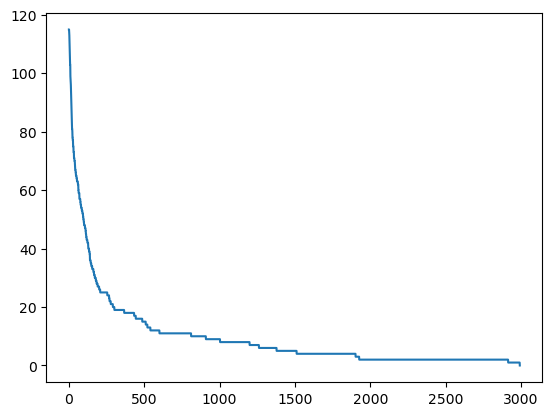

In [28]:
plt.plot(least_cost)

In [1]:
from bayes_opt import BayesianOptimization

In [2]:
def black_box_function(x, y):
    """Function with unknown internals we wish to maximize.

    This is just serving as an example, for all intents and
    purposes think of the internals of this function, i.e.: the process
    which generates its output values, as unknown.
    """
    return -x ** 2 - (y - 1) ** 2 + 1

In [3]:
pbounds = {'x': (2, 4), 'y': (-3, 3)}

optimizer = BayesianOptimization(
    f=black_box_function,
    pbounds=pbounds,
    random_state=1,
)

In [4]:
optimizer.maximize(
    init_points=2,
    n_iter=3,
)

|   iter    |  target   |     x     |     y     |
-------------------------------------------------
| 1         | -7.135    | 2.834     | 1.322     |
| 2         | -7.78     | 2.0       | -1.186    |
| 3         | -7.11     | 2.218     | -0.7867   |
| 4         | -12.4     | 3.66      | 0.9608    |
| 5         | -6.999    | 2.23      | -0.7392   |


In [5]:
print(optimizer.max)

{'target': -6.999472814518675, 'params': {'x': 2.2303920156083024, 'y': -0.7392021938893159}}


In [7]:
import numpy as np
import matplotlib.pyplot as plt

from bayes_opt import BayesianOptimization
from bayes_opt import acquisition


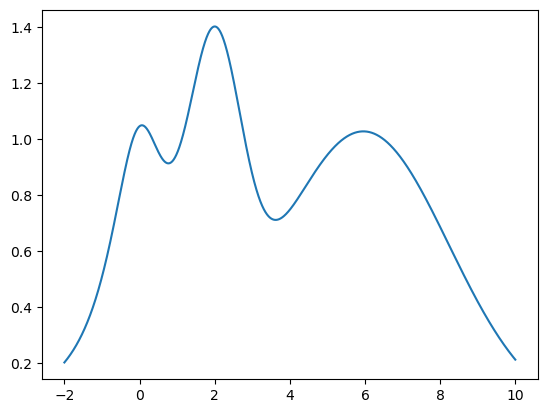

In [8]:
np.random.seed(42)
xs = np.linspace(-2, 10, 10000)

def f(x):
    return np.exp(-(x - 2) ** 2) + np.exp(-(x - 6) ** 2 / 10) + 1/ (x ** 2 + 1)

plt.plot(xs, f(xs))
plt.show()


In [9]:
def plot_bo(f, bo):
    x = np.linspace(-2, 10, 10000)
    mean, sigma = bo._gp.predict(x.reshape(-1, 1), return_std=True)

    plt.figure(figsize=(16, 9))
    plt.plot(x, f(x))
    plt.plot(x, mean)
    plt.fill_between(x, mean + sigma, mean - sigma, alpha=0.1)
    plt.scatter(bo.space.params.flatten(), bo.space.target, c="red", s=50, zorder=10)
    plt.show()


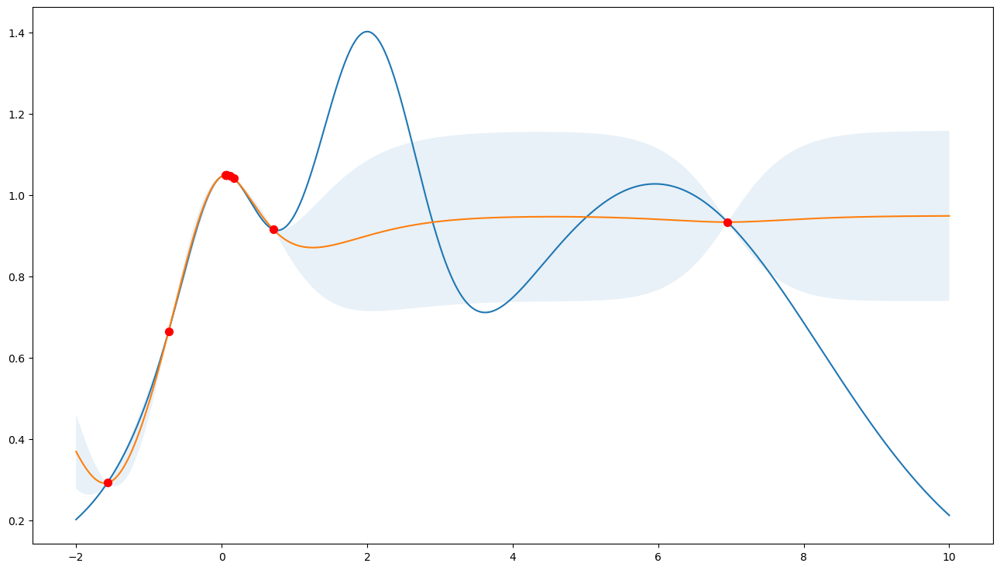

In [10]:
acquisition_function = acquisition.UpperConfidenceBound(kappa=0.1)

bo = BayesianOptimization(
    f=f,
    acquisition_function=acquisition_function,
    pbounds={"x": (-2, 10)},
    verbose=0,
    random_state=987234,
)

bo.maximize(n_iter=10)

plot_bo(f, bo)


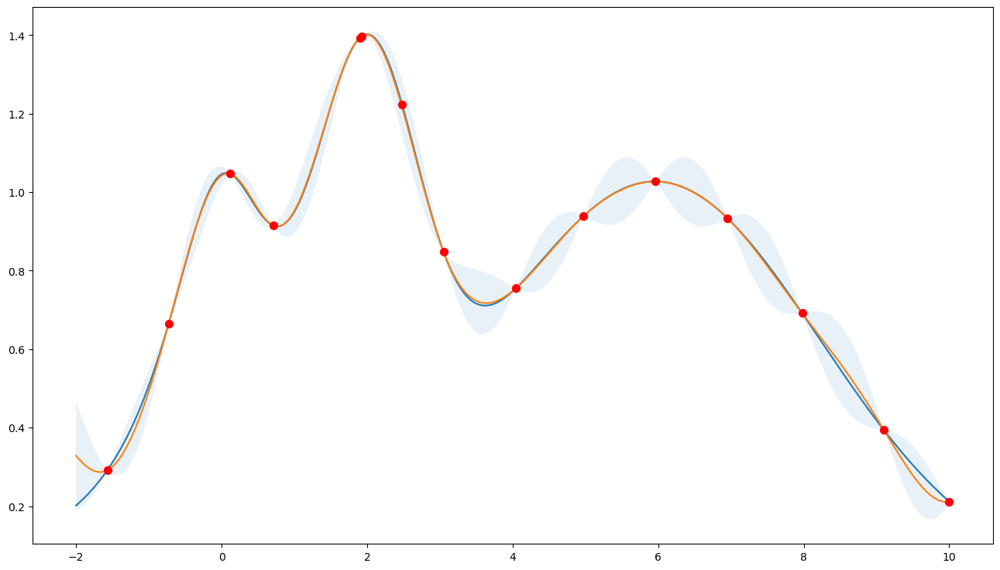

In [11]:
acquisition_function = acquisition.UpperConfidenceBound(kappa=10.)

bo = BayesianOptimization(
    f=f,
    acquisition_function=acquisition_function,
    pbounds={"x": (-2, 10)},
    verbose=0,
    random_state=987234,
)

bo.maximize(n_iter=10)

plot_bo(f, bo)


https://botorch.org/docs/acquisition

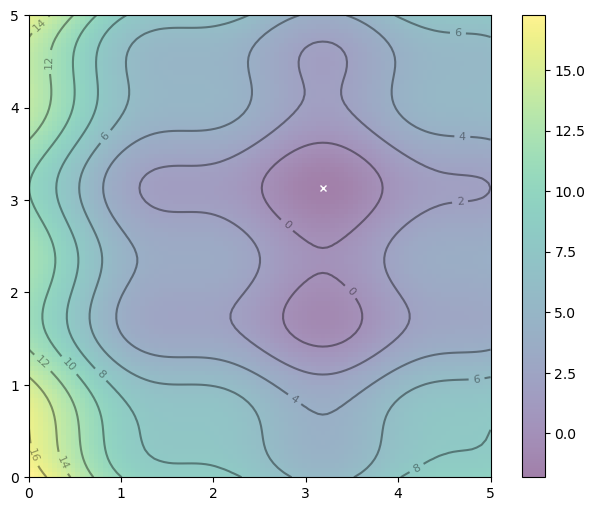

In [12]:
import numpy as np
import matplotlib.pyplot as plt

def f(x,y):
    "Objective function"
    return (x-3.14)**2 + (y-2.72)**2 + np.sin(3*x+1.41) + np.sin(4*y-1.73)

# Contour plot: With the global minimum showed as "X" on the plot
x, y = np.array(np.meshgrid(np.linspace(0,5,100), np.linspace(0,5,100)))
z = f(x, y)
x_min = x.ravel()[z.argmin()]
y_min = y.ravel()[z.argmin()]
plt.figure(figsize=(8,6))
plt.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
plt.colorbar()
plt.plot([x_min], [y_min], marker='x', markersize=5, color="white")
contours = plt.contour(x, y, z, 10, colors='black', alpha=0.4)
plt.clabel(contours, inline=True, fontsize=8, fmt="%.0f")
plt.show()

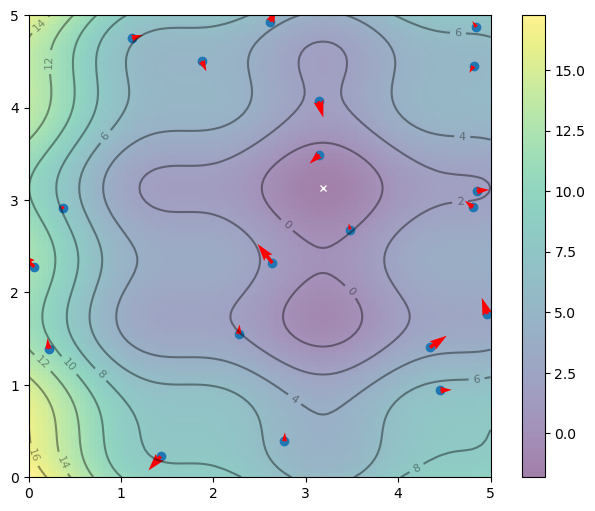

In [19]:
n_particles = 20
X = np.random.rand(2, n_particles) * 5
V = np.random.randn(2, n_particles) * 0.1

plt.figure(figsize=(8,6))
plt.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
plt.colorbar()
plt.plot([x_min], [y_min], marker='x', markersize=5, color="white")
contours = plt.contour(x, y, z, 10, colors='black', alpha=0.4)
plt.clabel(contours, inline=True, fontsize=8, fmt="%.0f")
plt.scatter(X[0], X[1])
plt.quiver(X[0], X[1], V[0], V[1], color='r', angles='xy', scale_units='xy', scale=1)
plt.show()

In [20]:
pbest = X
pbest_obj = f(X[0], X[1])
gbest = pbest[:, pbest_obj.argmin()]
gbest_obj = pbest_obj.min()

In [22]:
gbest

array([3.14699319, 3.49080857])

In [23]:
gbest_obj

-0.7223781632145772

In [24]:
pbest_obj.argmin()

16

In [28]:
c1 = c2 = 0.1
w = 0.8

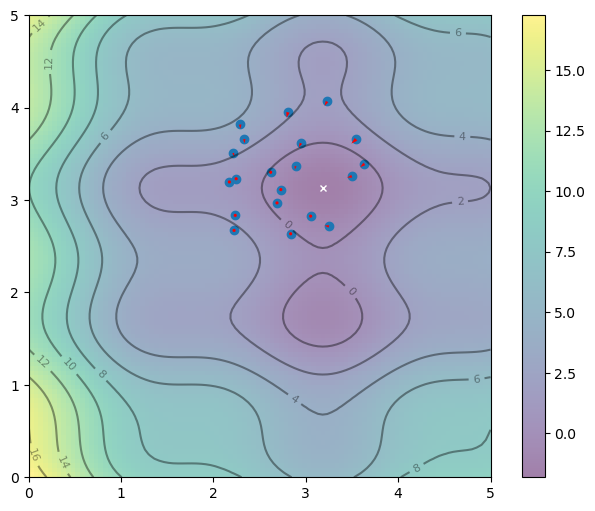

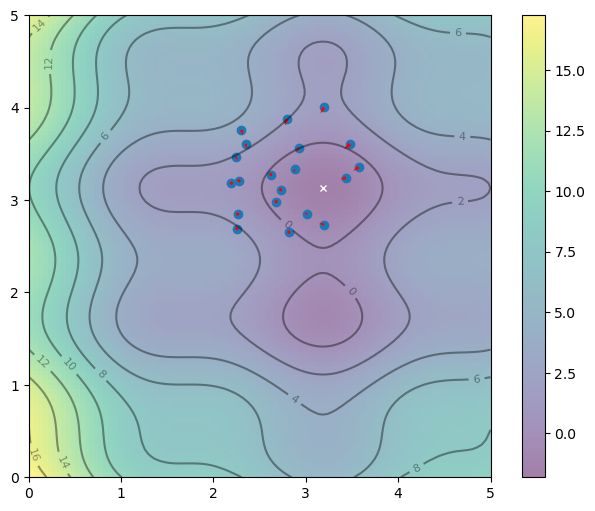

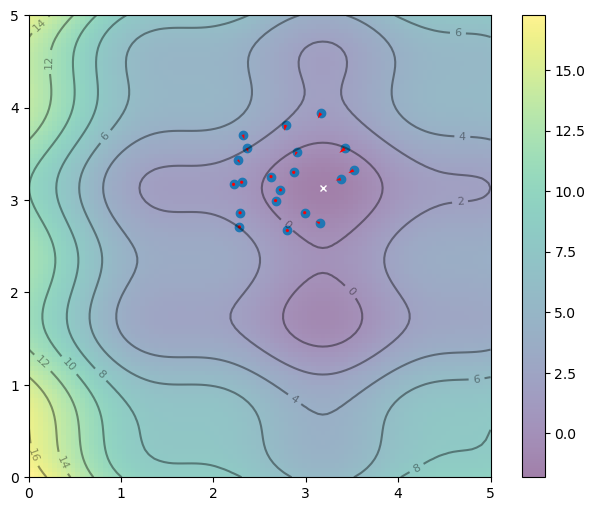

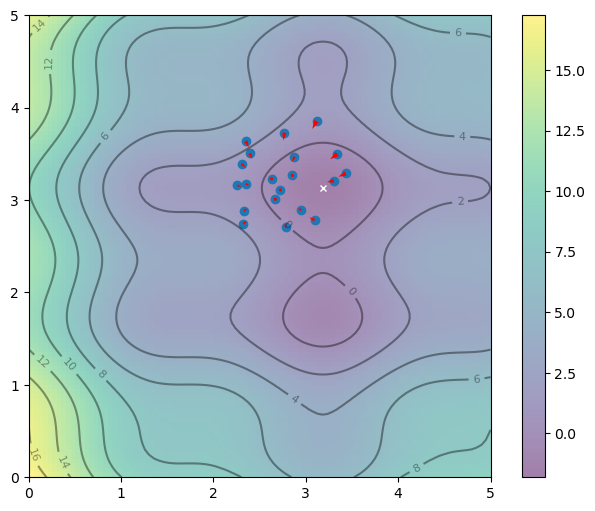

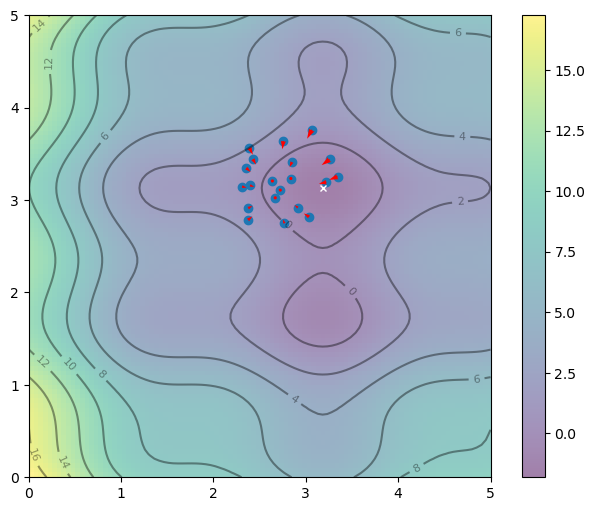

...

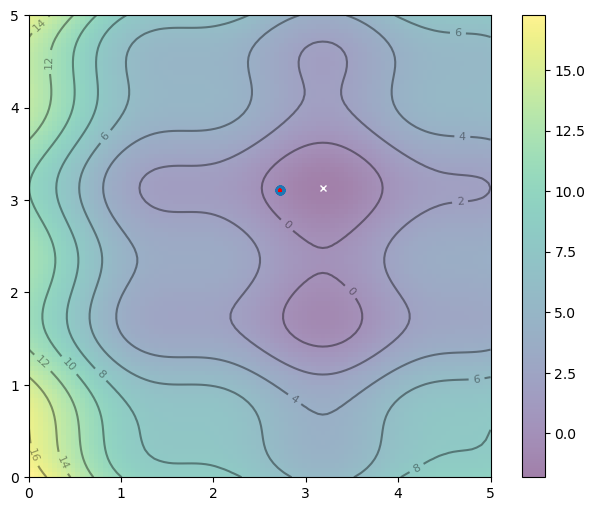

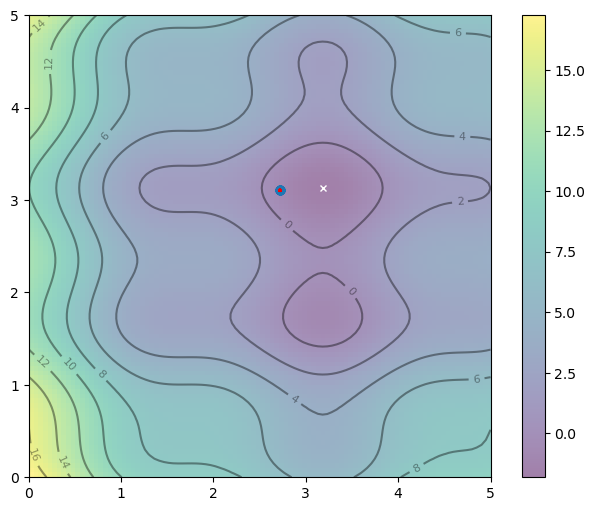

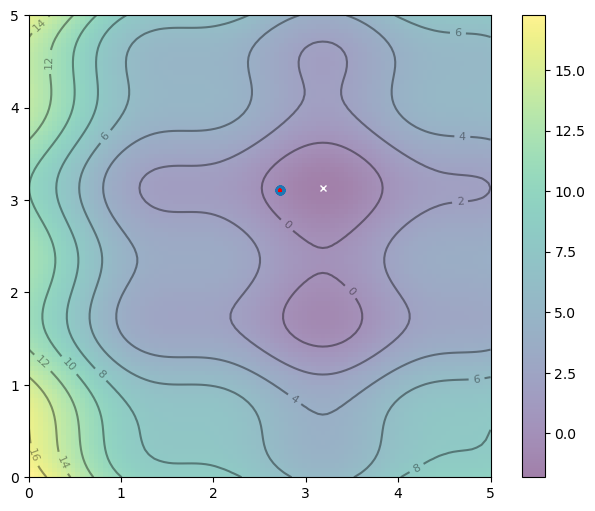

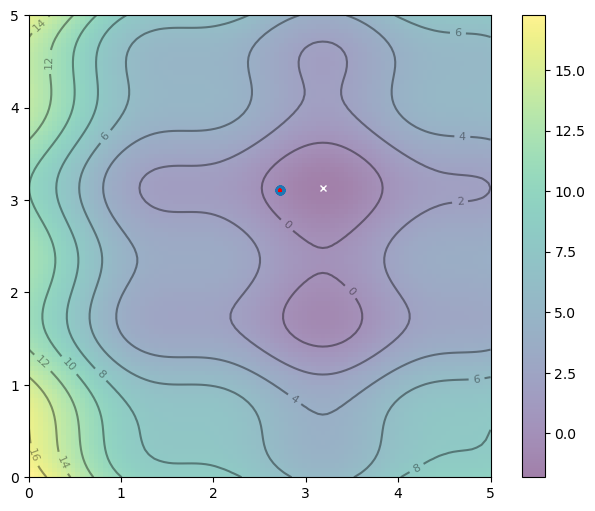

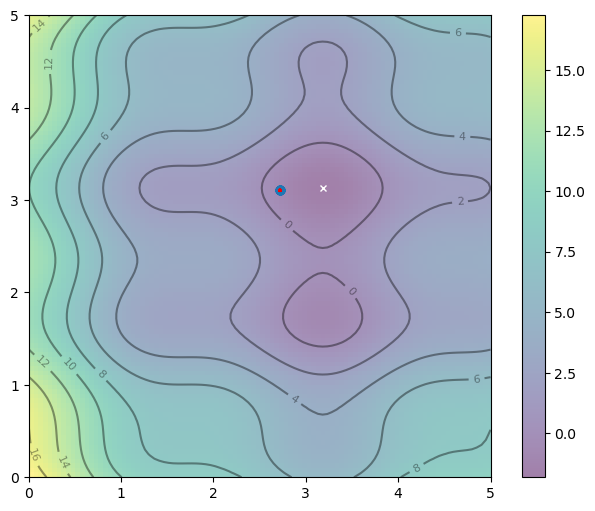

KeyboardInterrupt: 

In [57]:
for i in range(100):
    r = np.random.rand(2)
    V = w * V + c1*r[0]*(pbest - X) + c2*r[1]*(gbest.reshape(-1,1)-X)
    X = X + V
    obj = f(X[0], X[1])
    pbest[:, (pbest_obj >= obj)] = X[:, (pbest_obj >= obj)]
    pbest_obj = np.array([pbest_obj, obj]).max(axis=0)
    gbest = pbest[:, pbest_obj.argmin()]
    gbest_obj = pbest_obj.min()

    plt.figure(figsize=(8,6))
    plt.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
    plt.colorbar()
    plt.plot([x_min], [y_min], marker='x', markersize=5, color="white")
    contours = plt.contour(x, y, z, 10, colors='black', alpha=0.4)
    plt.clabel(contours, inline=True, fontsize=8, fmt="%.0f")
    plt.scatter(X[0], X[1])
    plt.quiver(X[0], X[1], V[0], V[1], color='r', angles='xy', scale_units='xy', scale=1)
    plt.show()

In [3]:
df = pd.read_csv('./odhf_v1.csv')

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x97 in position 353: invalid start byte

In [5]:
import chardet

# Detect encoding
with open('./odhf_v1.csv', 'rb') as f:
    result = chardet.detect(f.read())

print(result['encoding'])  # Print detected encoding

# Read file with detected encoding
df = pd.read_csv('./odhf_v1.csv', encoding=result['encoding'])

Windows-1252


In [41]:
montreal_filter = df[(df["province"] == "qc")& (df["source_facility_type"] == "general")& (df["city"] == "montréal")]

In [42]:
montreal_filter

,index,facility_name,source_facility_type,odhf_facility_type,provider,unit,street_no,street_name,postal_code,city,province,source_format_str_address,CSDname,CSDuid,Pruid,latitude,longitude
6782,6783,centre métropolitain de chirurgie plastique inc.,general,Hospitals,Public Health Agency of Canada,NaN,999,rue de salaberry,H3L1L2,montréal,qc,"999, rue de salaberry montréal qc h3l 1l2",Montréal,2466023.0,24,45.545430,-73.693126
6818,6819,ch de l'université de montréal (chum) - hôpita...,general,Hospitals,Public Health Agency of Canada,NaN,1560,rue sherbrooke est,H2L4M1,montréal,qc,"1560, rue sherbrooke est montréal qc h2l 4m1",Montréal,2466023.0,24,45.526110,-73.563900
6819,6820,ch de l'université de montréal (chum) - hôpita...,general,Hospitals,Public Health Agency of Canada,NaN,1058,rue saint-denis,H2X3J4,montréal,qc,"1058, rue saint-denis montréal qc h2x 3j4",Montréal,2466023.0,24,45.512315,-73.557714
6820,6821,ch de l'université de montréal (chum) - hôtel-...,general,Hospitals,Public Health Agency of Canada,NaN,3840,rue st-urbain,H2W1T8,montréal,qc,"3840, rue st-urbain montréal qc h2w 1t8",Montréal,2466023.0,24,45.514407,-73.577944
6860,6861,chu - sainte-justine,general,Hospitals,Public Health Agency of Canada,NaN,3175,côte sainte-catherine,H3T1C5,montréal,qc,"3175, côte sainte-catherine montréal qc h3t 1c5",Montréal,2466023.0,24,45.503005,-73.623688
8052,8053,hôpital maisonneuve-rosemont,general,Hospitals,Public Health Agency of Canada,NaN,5415,boul de l'assomption,H1T2M4,montréal,qc,"5415, boul. de l'assomption montréal qc h1t 2m4",Montréal,2466023.0,24,45.573411,-73.558466
8079,8080,hôpital santa cabrini,general,Hospitals,Public Health Agency of Canada,NaN,5655,rue st-zotique est,H1T1P7,montréal,qc,"5655, rue st-zotique est montréal qc h1t 1p7",Montréal,2466023.0,24,45.580136,-73.571491
8129,8130,jewish general hospital,general,Hospitals,Public Health Agency of Canada,NaN,3755,côte ste-catherine,H3T1E2,montréal,qc,"3755, côte ste-catherine montréal qc h3t 1e2",Montréal,2466023.0,24,45.497850,-73.628719
8252,8253,mcgill university health centre - Montréal che...,general,Hospitals,Public Health Agency of Canada,NaN,3650,st urbain,H2X2P4,montréal,qc,3650 st. urbain montréal qc h2x 2p4,Montréal,2466023.0,24,45.513014,-73.575210
8254,8255,mcgill university health centre - Montréal gen...,general,Hospitals,Public Health Agency of Canada,NaN,1650,cedar ave,H3G1A4,montréal,qc,1650 cedar ave. montréal qc h3g 1a4,Montréal,2466023.0,24,45.497064,-73.589032


In [40]:
montreal_filter.loc[8254]["facility_name"]

'mcgill university health centre - Montréal general campus'

In [43]:
montreal_filter.loc[8256]["facility_name"]

'mcgill university health centre - royal victoria hospital'

In [60]:
import os

path = "./CWEC_2020_QC"  # replace with your path
files = os.listdir(path)

# Filter to include only files (exclude directories)
files = [f.split("_") for f in files if os.path.isfile(os.path.join(path, f))]

In [61]:
files

[['CAN', 'QC', 'AMQUI', '7050145', 'CWEC.epw'],
 ['CAN', 'QC', 'BAGOTVILLE-A', '7060400', 'CWEC.epw'],
 ['CAN', 'QC', 'BAIE-COMEAU-A', '7040442', 'CWEC.epw'],
 ['CAN', 'QC', 'BAIE-COMEAU', '704S001', 'CWEC.epw'],
 ['CAN', 'QC', 'BARRAGE-TEMISCAMINGUE', '7080468', 'CWEC.epw'],
 ['CAN', 'QC', 'BEAUCEVILLE', '7028754', 'CWEC.epw'],
 ['CAN', 'QC', 'BEAUPORT', '7010565', 'CWEC.epw'],
 ['CAN', 'QC', 'BONNARD-1', '7060826', 'CWEC.epw'],
 ['CAN', 'QC', "CAP-D'ESPOIR", '7051050', 'CWEC.epw'],
 ['CAN', 'QC', 'CAP-MADELEINE', '7051163', 'CWEC.epw'],
 ['CAN', 'QC', 'CAP-ROUGE', '7041166', 'CWEC.epw'],
 ['CAN', 'QC', 'CAP-TOURMENTE', '7041JG6', 'CWEC.epw'],
 ['CAN', 'QC', 'CAPE-WHITTLE', '7041100', 'CWEC.epw'],
 ['CAN', 'QC', 'CHAMOUCHOUANE', '7061288', 'CWEC.epw'],
 ['CAN', 'QC', 'CHAPAIS', '7091299', 'CWEC.epw'],
 ['CAN', 'QC', 'CHARLEVOIX-(MRC)', '7041312', 'CWEC.epw'],
 ['CAN', 'QC', 'CHEVERY', '7041382', 'CWEC.epw'],
 ['CAN', 'QC', 'CHUTE-DES-PASSES', '7061541', 'CWEC.epw'],
 ['CAN', 'QC', 'DE

In [113]:
quebec_stations_reference

,version,name,prov,country,climate_ID,lat,lon,UTC_offset,elev(m),first_yr,last_yr
425,CWEEDS2011,AMQUI,QC,CAN,7050145,48.47,-67.43,-5,166.0,1998,2017
426,CWEEDS2011,BAGOTVILLE A,QC,CAN,7060400,48.33,-71.00,-5,159.1,1998,2017
427,CWEEDS2011,BAIE-COMEAU A,QC,CAN,7040442,49.13,-68.20,-5,21.6,1998,2017
428,CWEEDS2011,BAIE-COMEAU,QC,CAN,704S001,49.26,-68.15,-5,129.5,1998,2017
429,CWEEDS2011,BARRAGE TEMISCAMINGUE,QC,CAN,7080468,46.71,-79.10,-5,181.4,1998,2017
...,...,...,...,...,...,...,...,...,...,...,...
501,CWEEDS2011,STE-ANNE-DE-BELLEVUE 1,QC,CAN,702FHL8,45.43,-73.93,-5,39.0,1998,2017
502,CWEEDS2011,STE-CLOTHILDE,QC,CAN,7027039,45.17,-73.68,-5,53.0,1998,2017
503,CWEEDS2011,STE-FOY (U. LAVAL),QC,CAN,701Q004,46.78,-71.29,-5,91.4,1998,2017
504,CWEEDS2011,VAL-D'OR,QC,CAN,7098603,48.06,-77.79,-5,338.9,1998,2017


In [121]:
quebec_full_WGS["Zone"] = 0
for index, row in quebec_full_WGS.iterrows():
    differenec_coords = [51.0,0]-np.array(row.geometry.centroid.coords[0])[::-1]
    if differenec_coords[0] > 0:
        quebec_full_WGS.at[index, "Zone"] = 1
    else:
        pass
    

In [115]:
coors_stations

,lat,lon
425,48.47,-67.43
426,48.33,-71.00
427,49.13,-68.20
428,49.26,-68.15
429,46.71,-79.10
...,...,...
501,45.43,-73.93
502,45.17,-73.68
503,46.78,-71.29
504,48.06,-77.79


In [117]:
differenec_coords

array([ 5.83207017, 72.75723574])

In [119]:
quebec_full_WGS["Zone"] = 0

In [122]:
quebec_full_WGS

,CDUID,CDNAME,CDTYPE,PRUID,PRNAME,geometry,Maison individuelle non attenante,Maison jumelée,Maison en rangée,Appartement ou plain-pied dans un duplex,Appartement dans un immeuble de moins de cinq étages,Appartement dans un immeuble de cinq étages ou plus,weather_index,Zone
56,2447,La Haute-Yamaska,MRC,24,Quebec / Québec,"POLYGON ((-72.60701 45.53762, -72.60611 45.526...",19880,2955,540,2625,13630,515,445.0,1
58,2448,Acton,MRC,24,Quebec / Québec,"POLYGON ((-72.58505 45.78258, -72.5769 45.7778...",4910,240,90,340,1090,0,464.0,1
59,2449,Drummond,MRC,24,Quebec / Québec,"POLYGON ((-72.50598 46.08385, -72.50394 46.083...",26590,2435,830,3660,13730,490,482.0,1
60,2450,Nicolet-Yamaska,MRC,24,Quebec / Québec,"MULTIPOLYGON (((-72.35386 46.24893, -72.3519 4...",7740,405,70,455,1680,0,482.0,1
61,2451,Maskinongé,MRC,24,Quebec / Québec,"POLYGON ((-73.26325 46.88718, -73.25424 46.884...",13315,340,160,925,2300,0,498.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,2442,Le Val-Saint-François,MRC,24,Quebec / Québec,"POLYGON ((-72.01948 45.70144, -72.01442 45.698...",9885,320,85,1025,2160,0,464.0,1
207,2443,Sherbrooke,TÉ,24,Quebec / Québec,"POLYGON ((-71.89602 45.50587, -71.88665 45.500...",29730,4115,2385,4530,36655,2445,468.0,1
208,2444,Coaticook,MRC,24,Quebec / Québec,"POLYGON ((-71.64346 45.26714, -71.64344 45.266...",5755,230,65,470,1485,0,468.0,1
209,2445,Memphrémagog,MRC,24,Quebec / Québec,"MULTIPOLYGON (((-72.18404 45.44723, -72.18416 ...",17495,835,435,1400,5045,40,464.0,1


Text(0.5, 1.0, 'ZONE DE DÉMARQUATION')

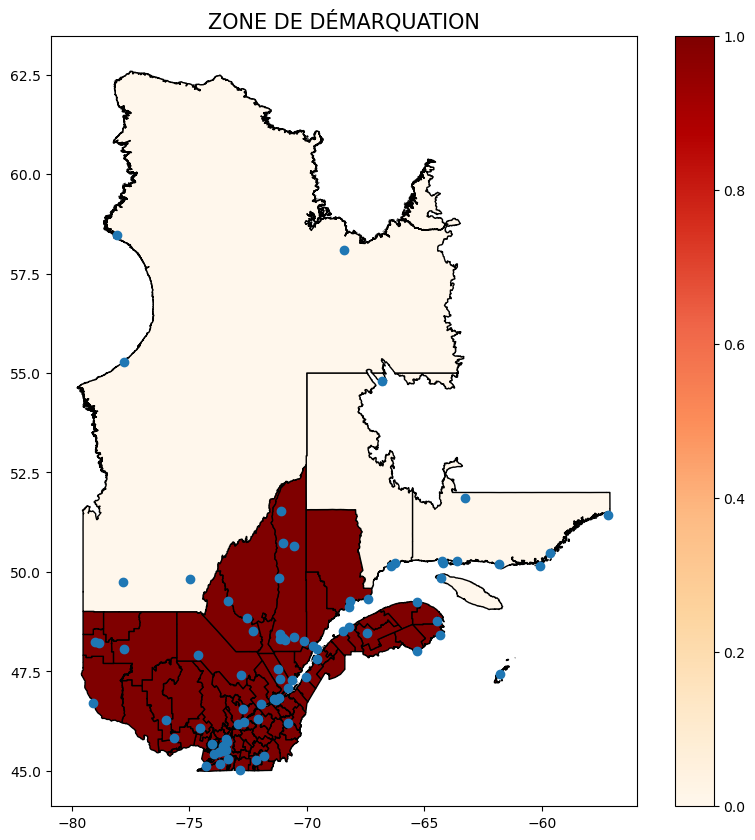

In [126]:
fig, ax = plt.subplots(figsize=(10, 10))
quebec_full_WGS.plot(column = "Zone", ax=ax, cmap='OrRd', edgecolor='black',legend=True)
# Add title and remove axes
coors_stations = quebec_stations_reference[["lat","lon"]]
ax.scatter(coors_stations["lon"], coors_stations["lat"])
ax.set_title('ZONE DE DÉMARQUATION', fontsize=15)


# ax.set_axis_off()
# plt.show()



In [2]:
quebec_full_WGS

NameError: name 'quebec_full_WGS' is not defined